In [ ]:
#@title ## Cross-domain-Cycle-Consistent-CyCADA-CycleGAN-and-HPO v10

Runnable @ https://colab.research.google.com/drive/1FeajBaG6RPCPHyjoGeKBg3qzguRLoh_I?usp=sharing

HTML [Viewable](https://c6ai.github.io/CycleGAN_CyCADA_Style_Transfer_and_HPO) Online @ https://c6ai.github.io/CycleGAN_CyCADA_Style_Transfer_and_HPO



### Introduction

The driving purpose of this report was to improve the generalization and transferability of learning by leveraging visual information and latent representations, using the latest advancements such as (Rahman 2022) Style-Transfer Deep RL (STDRL), adapted for our final project amongst other methods that “may use visual information and latent representations to improve the generalization and transferability of RL agents. STDRL may use style transfer techniques to generate diverse and realistic visual observations for RL agents from a fixed dataset, which can enhance the data efficiency and robustness of the agents. MLR may use mask-based techniques to reconstruct latent states from partial observations, which can enable the agents to handle occlusions and missing information. STDRL and MLR may be based on the methods proposed by Rahman and Xue (2020; 2022) and adapted to hyperbolic RL settings”; notwithstanding that most STDRL methods “rely on pre-trained models or fixed datasets for style transfer or latent reconstruction, which may limit their applicability to novel domains or tasks”.

> STDRL Ref: Rahman, M. M., & Xue, Y. (2022). Bootstrap State Representation using Style Transfer for Better Generalization in Deep Reinforcement Learning. In Proceedings of the European Conference on Machine Learning and Principles and Practice of Knowledge Discovery in Databases (ECML-PKDD).


Nevertheless, given this report's limited scope, we had to reserve publishing our advanced stage HPO (Hyperparameter Opt.) for such STDRL to the Appendix of the final project, and rather opted instead to explore the foundations of HPO for minimal CNNs and GANs on MNIST variants & Cifar10; before finally building from scratch a Style-Transfer GAN [rather than a Style-Transfer Deep RL] to demonstrate the more generalized application of such promising 1st technology.

Moreover, considering the [needs must] long and thorough set up needed to be later documented as an actual reproducible code towards above-stated objectives; and for the sake of not boring any beginner reader by the complexity of the code without first getting the bigger picture, it was deemed more readable to start the report with this introductory section before initializing both the [code lengthy] manual and TensorBoard-based HPOs.

Therefore, below is both a primer and a walkthrough of the Keras implementation of [Cross-domain Cycle-Consistent] CycleGAN & CyCADA, as understood having had read the valuable Chapter 7 [pages 220-252] of the Atienza, R. (2018). Advanced Deep Learning with TensorFlow 2 and Keras. Packt Publishing:


### CycleGAN & CyCADA

CycleGAN is a technique for translating images from one domain to another without paired examples. It uses two generators and two discriminators that form a cycle of transformations. The generators are U-Networks and the discriminators are decoders with PatchGAN option. The cycle consistency loss ensures that the original image can be reconstructed from the translated image. CycleGAN can be used for various applications such as season translation, style transfer, and object transfiguration.

Ref: (Zhu, 2017) "Unpaired Image-to-Image Translation Using Cycle-Consistent Adversarial Networks"


Cross-domain transfer is a term that refers to the process of transforming an image from one form to another, such as changing its style, color, or content. For example, cross-domain transfer can be used to colorize grayscale images, convert satellite images to maps, or make summer photos look like winter. Cross-domain transfer has many practical applications in various fields such as computer vision, computer graphics, image processing, and autonomous driving. In this report, we will introduce cross-domain Generative Adversarial Networks (GANs), which are a type of neural network that can learn to generate realistic images across different domains using adversarial training.

GANs are a type of machine learning model that can generate realistic images, videos, and voices from training data. They consist of two neural networks: a generator that creates new data instances, and a discriminator that evaluates how real they are. One of the applications of GANs is cross-domain translation, which means transforming an image from one domain to another, such as turning a photo into a painting. CycleGAN is a popular algorithm for cross-domain translation that does not require paired training data, unlike other methods such as pix2pix. CycleGAN can learn to translate images between domains using only unpaired collections of images, such as satellite images and maps.

CycleGAN is a method for learning how to translate images from one domain to another without paired examples. It uses two generators and two discriminators that are trained adversarially and cyclically. The generators try to fool the discriminators by producing realistic images in the target domain, while the discriminators try to distinguish between real and fake images. The cycle consistency loss ensures that the generators can also reconstruct the original images from the translated ones. CycleGAN can be used for various image manipulation tasks such as style transfer, photo enhancement, object transfiguration, and season transfer  .

CycleGAN is a model that aims to solve the image-to-image translation problem without requiring paired examples of input and output images. For instance, it can learn to colorize grayscale images by using two generators and two discriminators. The generators use a U-Net structure to map the latent representation of the source domain (grayscale) to the target domain (color) and vice versa. The discriminators try to distinguish between real and fake images from each domain. To ensure that the generators preserve the content of the input images, CycleGAN also uses a cycle-consistency loss that penalizes the difference between the original and reconstructed images.

U-Net is a convolutional neural network that was designed for biomedical image segmentation. It has a u-shaped architecture that consists of two parts: an encoder and a decoder. The encoder applies convolutions, ReLUs and max pooling to reduce the spatial dimension and increase the feature information of the input image. The decoder uses upsampling and convolutions to restore the spatial dimension and combine it with feature information from the encoder. The encoder and decoder layers are connected by skip connections, which concatenate the outputs of corresponding layers. This allows the network to preserve spatial information across different resolutions and produce more precise segmentations. U-Net also uses instance normalization instead of batch normalization, which normalizes each image or feature separately. This helps to maintain contrast in style transfer tasks. U-Net can work with fewer training images and handle different types of images, such as satellite or handwritten images. The discriminator of U-Net is similar to a vanilla GAN discriminator, but it can use patchGANs to predict the probability of each patch being real or fake, instead of using a single scalar value for the whole image. This improves parameter efficiency and image quality for the generator.

Finally, "before we can use the CycleGAN to build and train functions, we have to perform some data preparation. The modules cifar10_utils.py and other_utils.py load the CIFAR10 train and test data." After loading, the "train and test images are converted to grayscale to generate the source data and test source data."

# HPO (Hyperparameter Opt. Tuning) & TB Dashboard

In [ ]:
!pip install -q datasets

In [ ]:
import time
import pickle
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.callbacks import TensorBoard

# pickle_in = open("X.pickle","rb")
# X = pickle.load(pickle_in)
# pickle_in = open("y.pickle","rb")
# y = pickle.load(pickle_in)
# X = X/255.0

(train_images, train_labels), (test_images, test_labels) = datasets.cifar10.load_data()
# Normalize pixel values to be between 0 and 1
# train_images, test_images = train_images / 255.0, test_images / 255.0
X, y = train_images / 255.0, test_images / 255.0

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

170498071/170498071 [==============================] - 4s 0us/step


In [ ]:
assert tf.test.is_gpu_available()
assert tf.test.is_built_with_cuda()

2-conv-64-nodes-0-dense-1679241463
Epoch 1/10
1563/1563 [==============================] - 21s 5ms/step - loss: 2.6357 - accuracy: 0.1065 - val_loss: 2.3020 - val_accuracy: 0.1001
Epoch 2/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.2992 - accuracy: 0.1050 - val_loss: 2.3008 - val_accuracy: 0.1034
Epoch 3/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.2957 - accuracy: 0.1083 - val_loss: 2.3053 - val_accuracy: 0.1050
Epoch 4/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.2921 - accuracy: 0.1109 - val_loss: 2.3145 - val_accuracy: 0.1047
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.2842 - accuracy: 0.1136 - val_loss: 2.3168 - val_accuracy: 0.1049
Epoch 6/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.2776 - accuracy: 0.1185 - val_loss: 2.3339 - val_accuracy: 0.1052
Epoch 7/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.2636 - accuracy: 0.130

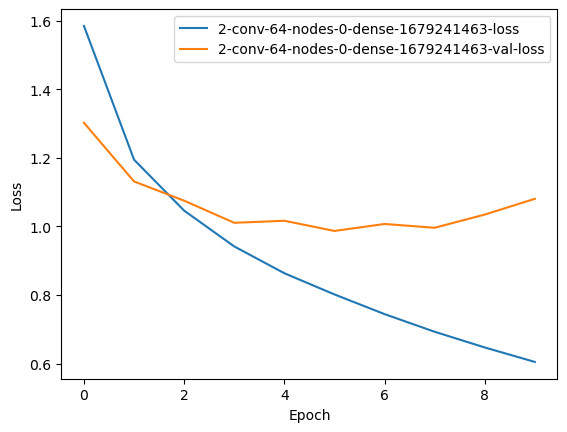

In [ ]:
# dense_layers = [0, 1]
# layer_sizes = [32, 64]
# conv_layers = [1, 2]

# dense_layers = [0, 1, 2]
# layer_sizes = [32, 64, 128]
# conv_layers = [1, 2, 3]

dense_layers = [0]
layer_sizes = [64]
conv_layers = [2]

for dense_layer in dense_layers:
    for layer_size in layer_sizes:
        for conv_layer in conv_layers:
            NAME = "{}-conv-{}-nodes-{}-dense-{}".format(conv_layer, layer_size, dense_layer, int(time.time()))
            print(NAME)

            model = models.Sequential()
            # model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)))
            model.add(Conv2D(layer_size, (3, 3), input_shape=X.shape[1:]))
            model.add(Activation('relu'))
            # model.add(layers.MaxPooling2D((2, 2)))
            model.add(MaxPooling2D(pool_size=(2, 2)))

            # model.add(layers.Conv2D(64, (3, 3), activation='relu'))
            # model.add(layers.MaxPooling2D((2, 2)))
            # model.add(layers.Conv2D(64, (3, 3), activation='relu'))
            for l in range(conv_layer-1):
                model.add(Conv2D(layer_size, (3, 3)))
                model.add(Activation('relu'))
                ## model.add(MaxPooling2D(pool_size=(2, 2)))         

            # model.add(layers.Flatten())
            model.add(Flatten())

            # model.add(layers.Dense(64, activation='relu'))
            for _ in range(dense_layer):
                model.add(Dense(layer_size))
                model.add(Activation('relu'))

            ## model.add(Dense(1))
            ## model.add(Activation('sigmoid'))
            model.add(layers.Dense(10))

            tensorboard = TensorBoard(log_dir="logs/{}".format(NAME))

            ## model.compile(loss='binary_crossentropy',
            ##               optimizer='adam',
            ##               metrics=['accuracy'],
            ##               )
            model.compile(optimizer='adam',
                          loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                          metrics=['accuracy'])
            history = model.fit(train_images, train_labels, epochs=10, 
                                validation_data=(test_images, test_labels))
            
            # history = model.fit(train_images, train_labels, epochs=10, 
            #                     validation_data=(test_images, test_labels))
            # history = model.fit(X, y,
            #           batch_size=32,
            #           epochs=10,
            #           validation_split=0.3,
            #           callbacks=[tensorboard])
            history = model.fit(X, train_labels,
                      epochs=10,
                      validation_data=(y, test_labels),
                      callbacks=[tensorboard])
            
            # plt.plot(history.history['accuracy'], label='accuracy')
            # plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
            plt.plot(history.history['loss'], label='{}-loss'.format(NAME))
            plt.plot(history.history['val_loss'], label='{}-val-loss'.format(NAME))
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            # plt.ylim([0.5, 1]) ## only for limiting ACCURACY y-axis!
            plt.legend(loc='upper right')

            # test_loss, test_acc = model.evaluate(test_images,  test_labels, verbose=2)
            test_loss, test_acc = model.evaluate(y,  test_labels, verbose=2)
            # print(NAME)
            print('{}-test-loss'.format(NAME))
            print(test_loss)
            model.summary()
            print('###################')
            print()


In [ ]:
### Given the lack of robustness, below is the originally tuned HPO

"""
2-conv-64-nodes-0-dense-1679220205
Epoch 1/10
1563/1563 [==============================] - 21s 5ms/step - loss: 2.6045 - accuracy: 0.1186 - val_loss: 2.3005 - val_accuracy: 0.1067
Epoch 2/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.3001 - accuracy: 0.1160 - val_loss: 2.3030 - val_accuracy: 0.1015
Epoch 3/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.2984 - accuracy: 0.1060 - val_loss: 2.3062 - val_accuracy: 0.1239
Epoch 4/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.2910 - accuracy: 0.1149 - val_loss: 2.2955 - val_accuracy: 0.1244
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.2590 - accuracy: 0.1394 - val_loss: 2.0051 - val_accuracy: 0.2812
Epoch 6/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.8516 - accuracy: 0.3294 - val_loss: 1.6329 - val_accuracy: 0.4263
Epoch 7/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.4937 - accuracy: 0.4750 - val_loss: 1.5108 - val_accuracy: 0.4740
Epoch 8/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.0614 - accuracy: 0.6286 - val_loss: 1.0904 - val_accuracy: 0.6148
Epoch 4/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.9518 - accuracy: 0.6678 - val_loss: 1.0373 - val_accuracy: 0.6348
Epoch 5/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.8739 - accuracy: 0.6973 - val_loss: 1.0326 - val_accuracy: 0.6416
Epoch 6/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.8003 - accuracy: 0.7217 - val_loss: 1.0316 - val_accuracy: 0.6495
Epoch 7/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.7401 - accuracy: 0.7433 - val_loss: 1.0059 - val_accuracy: 0.6638
Epoch 8/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.6768 - accuracy: 0.7649 - val_loss: 1.0160 - val_accuracy: 0.6638
Epoch 9/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.6289 - accuracy: 0.7825 - val_loss: 1.0247 - val_accuracy: 0.6668
Epoch 10/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.5761 - accuracy: 0.8008 - val_loss: 1.0904 - val_accuracy: 0.6602
313/313 - 1s - loss: 1.0904 - accuracy: 0.6602 - 781ms/epoch - 2ms/step
2-conv-64-nodes-0-dense-1679220205-test-loss
1.090354561805725
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param   
=================================================================
 conv2d (Conv2D)             (None, 30, 30, 64)        1792      
                                                                 
 activation (Activation)     (None, 30, 30, 64)        0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        36928     
                                                                 
 activation_1 (Activation)   (None, 13, 13, 64)        0         
                                                                 
 flatten (Flatten)           (None, 10816)             0         
                                                                 
 dense (Dense)               (None, 10)                108170    
                                                                 
=================================================================
Total params: 146,890
Trainable params: 146,890
Non-trainable params: 0
_________________________________________________________________
###################
 """
print()

![](https://raw.githubusercontent.com/c6ai/CycleGAN_CyCADA_Style_Transfer_and_HPO/main/Assets/1st-TB-HPO-Cifar10-Overfitting-1-Conv.png)

## HPO Result Interpretation
The tuned hyperparameter of **8 epochs with such 2-Conv-64-Nodes-0-Dense** architecture shows a promising generalisation, given that above Val_Loss plot clearly proofs that only **after 8 epochs overfitting satarts to creep in**!

In [ ]:
#@title ### Additional Shallower Sweep
dense_layers = [0, 1]
layer_sizes = [32, 64]
conv_layers = [1, 2]
"""
 1-conv-32-nodes-0-dense-1679223061
Epoch 1/10
1563/1563 [==============================] - 7s 4ms/step - loss: 3.2266 - accuracy: 0.2638 - val_loss: 2.0506 - val_accuracy: 0.2697
Epoch 2/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.8387 - accuracy: 0.3696 - val_loss: 1.8593 - val_accuracy: 0.3550
Epoch 3/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.6988 - accuracy: 0.4188 - val_loss: 1.7698 - val_accuracy: 0.4108
Epoch 4/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.6267 - accuracy: 0.4455 - val_loss: 1.7867 - val_accuracy: 0.4270
Epoch 5/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.5741 - accuracy: 0.4632 - val_loss: 2.1164 - val_accuracy: 0.3472
Epoch 6/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.5624 - accuracy: 0.4655 - val_loss: 1.8725 - val_accuracy: 0.4251
Epoch 7/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.4899 - accuracy: 0.4947 - val_loss: 1.9966 - val_accuracy: 0.3945
Epoch 8/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.4815 - accuracy: 0.4920 - val_loss: 2.0890 - val_accuracy: 0.3607
Epoch 9/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.4473 - accuracy: 0.5030 - val_loss: 2.0184 - val_accuracy: 0.4416
Epoch 10/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.4218 - accuracy: 0.5156 - val_loss: 2.1320 - val_accuracy: 0.4223
Epoch 1/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.5610 - accuracy: 0.1055 - val_loss: 2.2902 - val_accuracy: 0.1140
Epoch 2/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.2968 - accuracy: 0.1099 - val_loss: 2.2992 - val_accuracy: 0.1153
Epoch 3/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.2948 - accuracy: 0.1100 - val_loss: 2.3059 - val_accuracy: 0.1129
Epoch 4/10
1563/1563 [==============================] - 6s 4ms/step - loss: 2.1075 - accuracy: 0.2181 - val_loss: 1.7849 - val_accuracy: 0.3646
Epoch 5/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.5749 - accuracy: 0.4373 - val_loss: 1.5402 - val_accuracy: 0.4535
Epoch 6/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.3788 - accuracy: 0.5126 - val_loss: 1.4532 - val_accuracy: 0.4913
Epoch 7/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.2622 - accuracy: 0.5573 - val_loss: 1.4423 - val_accuracy: 0.5089
Epoch 8/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.1782 - accuracy: 0.5897 - val_loss: 1.4288 - val_accuracy: 0.5280
Epoch 9/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.1126 - accuracy: 0.6118 - val_loss: 1.5047 - val_accuracy: 0.5073
Epoch 10/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.0668 - accuracy: 0.6272 - val_loss: 1.5209 - val_accuracy: 0.5236
Epoch 1/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.5852 - accuracy: 0.4312 - val_loss: 1.3073 - val_accuracy: 0.5311
Epoch 2/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.2374 - accuracy: 0.5662 - val_loss: 1.2219 - val_accuracy: 0.5698
Epoch 3/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.1051 - accuracy: 0.6134 - val_loss: 1.1466 - val_accuracy: 0.5974
Epoch 4/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.0263 - accuracy: 0.6443 - val_loss: 1.0894 - val_accuracy: 0.6240
Epoch 5/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.9605 - accuracy: 0.6652 - val_loss: 1.0808 - val_accuracy: 0.6267
Epoch 6/10
1563/1563 [==============================] - 6s 4ms/step - loss: 0.9065 - accuracy: 0.6849 - val_loss: 1.0372 - val_accuracy: 0.6401
Epoch 7/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.8664 - accuracy: 0.6996 - val_loss: 1.0409 - val_accuracy: 0.6426
Epoch 8/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.8331 - accuracy: 0.7123 - val_loss: 1.0649 - val_accuracy: 0.6345
Epoch 9/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.8046 - accuracy: 0.7212 - val_loss: 1.0298 - val_accuracy: 0.6464
Epoch 10/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.7737 - accuracy: 0.7307 - val_loss: 1.0848 - val_accuracy: 0.6356
313/313 - 1s - loss: 1.0848 - accuracy: 0.6356 - 714ms/epoch - 2ms/step
2-conv-32-nodes-0-dense-1679223211-test-loss
1.0848363637924194
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
=================================================================
 conv2d_3 (Conv2D)           (None, 30, 30, 32)        896       
                                                                 
 activation_3 (Activation)   (None, 30, 30, 32)        0         
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 15, 15, 32)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 13, 13, 32)        9248      
                                                                 
 activation_4 (Activation)   (None, 13, 13, 32)        0         
                                                                 
 flatten_2 (Flatten)         (None, 5408)              0         
                                                                 
 dense_2 (Dense)             (None, 10)                54090     
                                                                 
=================================================================
Total params: 64,234
Trainable params: 64,234
Non-trainable params: 0
_________________________________________________________________
###################

1-conv-64-nodes-0-dense-1679223366
Epoch 1/10
1563/1563 [==============================] - 8s 4ms/step - loss: 4.1663 - accuracy: 0.3002 - val_loss: 1.8713 - val_accuracy: 0.3476
Epoch 2/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.3232 - accuracy: 0.5361 - val_loss: 1.2543 - val_accuracy: 0.5627
Epoch 3/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.1527 - accuracy: 0.5986 - val_loss: 1.1820 - val_accuracy: 0.5861
Epoch 4/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.0468 - accuracy: 0.6366 - val_loss: 1.1069 - val_accuracy: 0.6148
Epoch 5/10
1563/1563 [==============================] - 6s 4ms/step - loss: 0.9579 - accuracy: 0.6703 - val_loss: 1.0935 - val_accuracy: 0.6221
Epoch 6/10
1563/1563 [==============================] - 6s 4ms/step - loss: 0.8937 - accuracy: 0.6943 - val_loss: 1.0904 - val_accuracy: 0.6271
Epoch 7/10
1563/1563 [==============================] - 6s 4ms/step - loss: 0.8393 - accuracy: 0.7122 - val_loss: 1.0626 - val_accuracy: 0.6310
Epoch 8/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.7912 - accuracy: 0.7294 - val_loss: 1.1285 - val_accuracy: 0.6227
Epoch 9/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.7524 - accuracy: 0.7417 - val_loss: 1.0879 - val_accuracy: 0.6349
Epoch 10/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.7113 - accuracy: 0.7559 - val_loss: 1.0917 - val_accuracy: 0.6444
313/313 - 1s - loss: 1.0917 - accuracy: 0.6444 - 738ms/epoch - 2ms/step
1-conv-64-nodes-0-dense-1679223366-test-loss
1.0916939973831177
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
=================================================================
 conv2d_5 (Conv2D)           (None, 30, 30, 64)        1792      
                                                                 
 activation_5 (Activation)   (None, 30, 30, 64)        0         
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 15, 15, 64)       0         
 2D)                                                             
                                                                 
 flatten_3 (Flatten)         (None, 14400)             0         
                                                                 
 dense_3 (Dense)             (None, 10)                144010    
                                                                 
=================================================================
Total params: 145,802
Trainable params: 145,802
Non-trainable params: 0
_________________________________________________________________
###################

2-conv-64-nodes-0-dense-1679223501
Epoch 1/10
1563/1563 [==============================] - 9s 5ms/step - loss: 2.0994 - accuracy: 0.3383 - val_loss: 1.5247 - val_accuracy: 0.4465
Epoch 2/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.3994 - accuracy: 0.5065 - val_loss: 1.3174 - val_accuracy: 0.5333
Epoch 3/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.2483 - accuracy: 0.5643 - val_loss: 1.2766 - val_accuracy: 0.5576
Epoch 4/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.1385 - accuracy: 0.6059 - val_loss: 1.3041 - val_accuracy: 0.5660
Epoch 5/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.0720 - accuracy: 0.6291 - val_loss: 1.3472 - val_accuracy: 0.5599
Epoch 6/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.0017 - accuracy: 0.6557 - val_loss: 1.3514 - val_accuracy: 0.5617
Epoch 7/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.9258 - accuracy: 0.6832 - val_loss: 1.4297 - val_accuracy: 0.5723
Epoch 8/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.8661 - accuracy: 0.7039 - val_loss: 1.5569 - val_accuracy: 0.5625
Epoch 9/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.7883 - accuracy: 0.7294 - val_loss: 1.6453 - val_accuracy: 0.5563
Epoch 10/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.7396 - accuracy: 0.7454 - val_loss: 1.8108 - val_accuracy: 0.5530
Epoch 1/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.5444 - accuracy: 0.4482 - val_loss: 1.3110 - val_accuracy: 0.5318
Epoch 2/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.2143 - accuracy: 0.5725 - val_loss: 1.1781 - val_accuracy: 0.5788
Epoch 3/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.0864 - accuracy: 0.6179 - val_loss: 1.0967 - val_accuracy: 0.6182
Epoch 4/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.9877 - accuracy: 0.6532 - val_loss: 1.0662 - val_accuracy: 0.6349
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.9084 - accuracy: 0.6836 - val_loss: 1.0635 - val_accuracy: 0.6355
Epoch 6/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.8400 - accuracy: 0.7096 - val_loss: 1.0298 - val_accuracy: 0.6503
Epoch 7/10
1360/1563 [=========================>....] - ETA: 0s - loss: 0.7850 - accuracy: 0.7275
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

1563/1563 [==============================] - 7s 4ms/step - loss: 2.3026 - accuracy: 0.0979 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 8/10
1563/1563 [==============================] - 6s 4ms/step - loss: 2.3026 - accuracy: 0.0984 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 9/10
1563/1563 [==============================] - 6s 4ms/step - loss: 2.3027 - accuracy: 0.0980 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 10/10
1563/1563 [==============================] - 6s 4ms/step - loss: 2.3027 - accuracy: 0.0963 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 1/10
1563/1563 [==============================] - 7s 4ms/step - loss: 2.2553 - accuracy: 0.1165 - val_loss: 1.8898 - val_accuracy: 0.2509
Epoch 2/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.6832 - accuracy: 0.3369 - val_loss: 1.5876 - val_accuracy: 0.3746
Epoch 3/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.5546 - accuracy: 0.3927 - val_loss: 1.5224 - val_accuracy: 0.4041
Epoch 4/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.4970 - accuracy: 0.4151 - val_loss: 1.4810 - val_accuracy: 0.4294
Epoch 5/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.4502 - accuracy: 0.4359 - val_loss: 1.4731 - val_accuracy: 0.4360
Epoch 6/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.4148 - accuracy: 0.4538 - val_loss: 1.4276 - val_accuracy: 0.4524
Epoch 7/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.3866 - accuracy: 0.4661 - val_loss: 1.4130 - val_accuracy: 0.4677
Epoch 8/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.3083 - accuracy: 0.5116 - val_loss: 1.3118 - val_accuracy: 0.5211
Epoch 9/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.2433 - accuracy: 0.5391 - val_loss: 1.2759 - val_accuracy: 0.5304
Epoch 10/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.2076 - accuracy: 0.5508 - val_loss: 1.2855 - val_accuracy: 0.5346
313/313 - 1s - loss: 1.2855 - accuracy: 0.5346 - 775ms/epoch - 2ms/step
1-conv-32-nodes-1-dense-1679223660-test-loss
1.2855437994003296
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
=================================================================
 conv2d_8 (Conv2D)           (None, 30, 30, 32)        896       
                                                                 
 activation_8 (Activation)   (None, 30, 30, 32)        0         
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 15, 15, 32)       0         
 2D)                                                             
                                                                 
 flatten_5 (Flatten)         (None, 7200)              0         
                                                                 
 dense_5 (Dense)             (None, 32)                230432    
                                                                 
 activation_9 (Activation)   (None, 32)                0         
                                                                 
 dense_6 (Dense)             (None, 10)                330       
                                                                 
=================================================================
Total params: 231,658
Trainable params: 231,658
Non-trainable params: 0
_________________________________________________________________
###################

2-conv-32-nodes-1-dense-1679223829
Epoch 1/10
1563/1563 [==============================] - 9s 5ms/step - loss: 2.2503 - accuracy: 0.2111 - val_loss: 1.7721 - val_accuracy: 0.3251
Epoch 2/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.6540 - accuracy: 0.3883 - val_loss: 1.5292 - val_accuracy: 0.4341
Epoch 3/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.4134 - accuracy: 0.4890 - val_loss: 1.3531 - val_accuracy: 0.5304
Epoch 4/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.2283 - accuracy: 0.5641 - val_loss: 1.2487 - val_accuracy: 0.5635
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.0644 - accuracy: 0.6266 - val_loss: 1.2070 - val_accuracy: 0.5858
Epoch 6/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.9485 - accuracy: 0.6679 - val_loss: 1.2496 - val_accuracy: 0.5877
Epoch 7/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.8576 - accuracy: 0.6999 - val_loss: 1.2671 - val_accuracy: 0.5888
Epoch 8/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.7800 - accuracy: 0.7263 - val_loss: 1.2532 - val_accuracy: 0.6054
Epoch 9/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.7127 - accuracy: 0.7502 - val_loss: 1.3893 - val_accuracy: 0.5796
Epoch 10/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.6583 - accuracy: 0.7657 - val_loss: 1.4531 - val_accuracy: 0.5952
Epoch 1/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.6588 - accuracy: 0.3952 - val_loss: 1.3280 - val_accuracy: 0.5157
Epoch 2/10
 373/1563 [======>.......................] - ETA: 4s - loss: 1.2982 - accuracy: 0.5343
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

1563/1563 [==============================] - 8s 5ms/step - loss: 0.5571 - accuracy: 0.8055 - val_loss: 1.0499 - val_accuracy: 0.6668
313/313 - 1s - loss: 1.0499 - accuracy: 0.6668 - 750ms/epoch - 2ms/step
2-conv-32-nodes-1-dense-1679223829-test-loss
1.0499475002288818
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
=================================================================
 conv2d_9 (Conv2D)           (None, 30, 30, 32)        896       
                                                                 
 activation_10 (Activation)  (None, 30, 30, 32)        0         
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 15, 15, 32)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 13, 13, 32)        9248      
                                                                 
 activation_11 (Activation)  (None, 13, 13, 32)        0         
                                                                 
 flatten_6 (Flatten)         (None, 5408)              0         
                                                                 
 dense_7 (Dense)             (None, 32)                173088    
                                                                 
 activation_12 (Activation)  (None, 32)                0         
                                                                 
 dense_8 (Dense)             (None, 10)                330       
                                                                 
=================================================================
Total params: 183,562
Trainable params: 183,562
Non-trainable params: 0
_________________________________________________________________
###################

1-conv-64-nodes-1-dense-1679223998
Epoch 1/10
1563/1563 [==============================] - 8s 4ms/step - loss: 3.0291 - accuracy: 0.3193 - val_loss: 1.7007 - val_accuracy: 0.4089
Epoch 2/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.6126 - accuracy: 0.4399 - val_loss: 1.5950 - val_accuracy: 0.4373
Epoch 3/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.4591 - accuracy: 0.4883 - val_loss: 1.6626 - val_accuracy: 0.4245
Epoch 4/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.3247 - accuracy: 0.5313 - val_loss: 1.5539 - val_accuracy: 0.4782
Epoch 5/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.1944 - accuracy: 0.5800 - val_loss: 1.3724 - val_accuracy: 0.5335
Epoch 6/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.0994 - accuracy: 0.6162 - val_loss: 1.4128 - val_accuracy: 0.5306
Epoch 7/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.0108 - accuracy: 0.6490 - val_loss: 1.4198 - val_accuracy: 0.5415
Epoch 8/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.9487 - accuracy: 0.6703 - val_loss: 1.3904 - val_accuracy: 0.5489
Epoch 9/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.8792 - accuracy: 0.6957 - val_loss: 1.4447 - val_accuracy: 0.5569
Epoch 10/10
1563/1563 [==============================] - 6s 4ms/step - loss: 0.8250 - accuracy: 0.7141 - val_loss: 1.5432 - val_accuracy: 0.5576
Epoch 1/10
1563/1563 [==============================] - 9s 5ms/step - loss: 1.7335 - accuracy: 0.3717 - val_loss: 1.4862 - val_accuracy: 0.4531
Epoch 2/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.3894 - accuracy: 0.4914 - val_loss: 1.3499 - val_accuracy: 0.5133
Epoch 3/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.2393 - accuracy: 0.5494 - val_loss: 1.2390 - val_accuracy: 0.5447
Epoch 4/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.1399 - accuracy: 0.5860 - val_loss: 1.1662 - val_accuracy: 0.5763
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.2415 - accuracy: 0.5600 - val_loss: 1.2776 - val_accuracy: 0.5549
Epoch 4/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.0626 - accuracy: 0.6273 - val_loss: 1.1947 - val_accuracy: 0.5955
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.9177 - accuracy: 0.6801 - val_loss: 1.1990 - val_accuracy: 0.5980
Epoch 6/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.7776 - accuracy: 0.7295 - val_loss: 1.2377 - val_accuracy: 0.6060
Epoch 7/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.6671 - accuracy: 0.7690 - val_loss: 1.4003 - val_accuracy: 0.6010
Epoch 8/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.5534 - accuracy: 0.8091 - val_loss: 1.5183 - val_accuracy: 0.6010
Epoch 9/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.4814 - accuracy: 0.8342 - val_loss: 1.5385 - val_accuracy: 0.6024
Epoch 10/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.4158 - accuracy: 0.8575 - val_loss: 1.8444 - val_accuracy: 0.5952
Epoch 1/10
1563/1563 [==============================] - 9s 5ms/step - loss: 1.5556 - accuracy: 0.4350 - val_loss: 1.2440 - val_accuracy: 0.5538
Epoch 2/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.1009 - accuracy: 0.6054 - val_loss: 1.0688 - val_accuracy: 0.6250
Epoch 3/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.9223 - accuracy: 0.6738 - val_loss: 0.9790 - val_accuracy: 0.6605
Epoch 4/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.7815 - accuracy: 0.7255 - val_loss: 0.9468 - val_accuracy: 0.6712
Epoch 5/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.6563 - accuracy: 0.7708 - val_loss: 0.9420 - val_accuracy: 0.6888
Epoch 6/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.5381 - accuracy: 0.8129 - val_loss: 0.9870 - val_accuracy: 0.6891
Epoch 7/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.4338 - accuracy: 0.8490 - val_loss: 1.0926 - val_accuracy: 0.6833
Epoch 8/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.3412 - accuracy: 0.8811 - val_loss: 1.2044 - val_accuracy: 0.6769
Epoch 9/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.2657 - accuracy: 0.9089 - val_loss: 1.3245 - val_accuracy: 0.6757
Epoch 10/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.2068 - accuracy: 0.9286 - val_loss: 1.4957 - val_accuracy: 0.6714
313/313 - 1s - loss: 1.4957 - accuracy: 0.6714 - 946ms/epoch - 3ms/step
2-conv-64-nodes-1-dense-1679224143-test-loss
1.495668888092041
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
=================================================================
 conv2d_12 (Conv2D)          (None, 30, 30, 64)        1792      
                                                                 
 activation_15 (Activation)  (None, 30, 30, 64)        0         
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 15, 15, 64)       0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 13, 13, 64)        36928     
                                                                 
 activation_16 (Activation)  (None, 13, 13, 64)        0         
                                                                 
 flatten_8 (Flatten)         (None, 10816)             0         
                                                                 
 dense_11 (Dense)            (None, 64)                692288    
                                                                 
 activation_17 (Activation)  (None, 64)                0         
                                                                 
 dense_12 (Dense)            (None, 10)                650       
                                                                 
=================================================================
Total params: 731,658
Trainable params: 731,658
Non-trainable params: 0
_________________________________________________________________
###################
 """
print()


The tuned hyperparameter of 4 epochs with the 2-Conv-64-Nodes-1-Dense architecture shows a promising generalisation, given that above Val_Loss plot clearly proofs that only after 4 epochs overfitting satarts to creep in!

![](https://raw.githubusercontent.com/c6ai/CycleGAN_CyCADA_Style_Transfer_and_HPO/main/Assets/1st-TB-HPO-Cifar10-Overfitting-2-Conv.png)

In [ ]:
#@title ### Additional Wider Sweep, just in case!

## Confirming the already concluded HPO tuned generalisation proofed as well above,
## alas at a huge non-eco-freindly GPU/TPU empact!!

dense_layers = [0, 1, 2]
layer_sizes = [32, 64, 128]
conv_layers = [1, 2, 3]

## Accuracy Logs
"""
1-conv-32-nodes-0-dense-1679181921
Epoch 1/10
1563/1563 [==============================] - 21s 4ms/step - loss: 5.1547 - accuracy: 0.2528 - val_loss: 2.0102 - val_accuracy: 0.2794
Epoch 2/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.8490 - accuracy: 0.3568 - val_loss: 1.9008 - val_accuracy: 0.3713
Epoch 3/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.7777 - accuracy: 0.3790 - val_loss: 1.7916 - val_accuracy: 0.3769
Epoch 4/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.6883 - accuracy: 0.4151 - val_loss: 1.9025 - val_accuracy: 0.3238
Epoch 5/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.6261 - accuracy: 0.4349 - val_loss: 1.7901 - val_accuracy: 0.4150
Epoch 6/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.6009 - accuracy: 0.4434 - val_loss: 2.0222 - val_accuracy: 0.3101
Epoch 7/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.5836 - accuracy: 0.4489 - val_loss: 2.0530 - val_accuracy: 0.4002
Epoch 8/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.5636 - accuracy: 0.4529 - val_loss: 1.9681 - val_accuracy: 0.4028
Epoch 9/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.5181 - accuracy: 0.4711 - val_loss: 2.1238 - val_accuracy: 0.3902
Epoch 10/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.4853 - accuracy: 0.4839 - val_loss: 2.1133 - val_accuracy: 0.3865
Epoch 1/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.7468 - accuracy: 0.3903 - val_loss: 1.4931 - val_accuracy: 0.4787
Epoch 2/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.3653 - accuracy: 0.5250 - val_loss: 1.3346 - val_accuracy: 0.5312
Epoch 3/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.2020 - accuracy: 0.5812 - val_loss: 1.1942 - val_accuracy: 0.5865
Epoch 4/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.1156 - accuracy: 0.6139 - val_loss: 1.1416 - val_accuracy: 0.6047
Epoch 5/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.0501 - accuracy: 0.6349 - val_loss: 1.1848 - val_accuracy: 0.5885
Epoch 6/10
1563/1563 [==============================] - 6s 4ms/step - loss: 0.9974 - accuracy: 0.6554 - val_loss: 1.0787 - val_accuracy: 0.6280
Epoch 7/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.9580 - accuracy: 0.6695 - val_loss: 1.1139 - val_accuracy: 0.6177
Epoch 8/10
1563/1563 [==============================] - 6s 4ms/step - loss: 0.9208 - accuracy: 0.6815 - val_loss: 1.1016 - val_accuracy: 0.6290
Epoch 9/10
1563/1563 [==============================] - 6s 4ms/step - loss: 0.8945 - accuracy: 0.6908 - val_loss: 1.0676 - val_accuracy: 0.6326
Epoch 10/10
1563/1563 [==============================] - 6s 4ms/step - loss: 0.8676 - accuracy: 0.7001 - val_loss: 1.1176 - val_accuracy: 0.6244
313/313 - 1s - loss: 1.1176 - accuracy: 0.6244 - 637ms/epoch - 2ms/step
0.6244000196456909
2-conv-32-nodes-0-dense-1679182093
Epoch 1/10
1563/1563 [==============================] - 9s 5ms/step - loss: 2.5233 - accuracy: 0.1076 - val_loss: 2.3019 - val_accuracy: 0.1042
Epoch 2/10
1563/1563 [==============================] - 7s 4ms/step - loss: 2.2965 - accuracy: 0.1112 - val_loss: 2.3168 - val_accuracy: 0.1138
Epoch 3/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.2905 - accuracy: 0.1162 - val_loss: 2.3109 - val_accuracy: 0.1051
Epoch 4/10
1563/1563 [==============================] - 7s 4ms/step - loss: 2.2869 - accuracy: 0.1133 - val_loss: 2.3124 - val_accuracy: 0.1030
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.2790 - accuracy: 0.1180 - val_loss: 2.3269 - val_accuracy: 0.1115
Epoch 6/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.1621 - accuracy: 0.1895 - val_loss: 1.9424 - val_accuracy: 0.2890
Epoch 7/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.7616 - accuracy: 0.3575 - val_loss: 1.6675 - val_accuracy: 0.4040
Epoch 8/10
1563/1563 [==============================] - 9s 5ms/step - loss: 1.5445 - accuracy: 0.4528 - val_loss: 1.5984 - val_accuracy: 0.4472
Epoch 9/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.4046 - accuracy: 0.5020 - val_loss: 1.5554 - val_accuracy: 0.4635
Epoch 10/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.3106 - accuracy: 0.5371 - val_loss: 1.5974 - val_accuracy: 0.4522
Epoch 1/10
1563/1563 [==============================] - 9s 6ms/step - loss: 1.6487 - accuracy: 0.4133 - val_loss: 1.3508 - val_accuracy: 0.5143
Epoch 2/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.2782 - accuracy: 0.5480 - val_loss: 1.2304 - val_accuracy: 0.5633
Epoch 3/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.1434 - accuracy: 0.5998 - val_loss: 1.1468 - val_accuracy: 0.6001
Epoch 4/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.0511 - accuracy: 0.6340 - val_loss: 1.1639 - val_accuracy: 0.5970
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.9872 - accuracy: 0.6571 - val_loss: 1.0730 - val_accuracy: 0.6261
Epoch 6/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.9340 - accuracy: 0.6766 - val_loss: 1.0595 - val_accuracy: 0.6338
Epoch 7/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.8937 - accuracy: 0.6889 - val_loss: 1.0403 - val_accuracy: 0.6371
Epoch 8/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.8548 - accuracy: 0.7041 - val_loss: 1.0901 - val_accuracy: 0.6336
Epoch 9/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.8229 - accuracy: 0.7163 - val_loss: 1.0631 - val_accuracy: 0.6351
Epoch 10/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.7945 - accuracy: 0.7265 - val_loss: 1.0685 - val_accuracy: 0.6416
313/313 - 1s - loss: 1.0685 - accuracy: 0.6416 - 996ms/epoch - 3ms/step
0.6416000127792358
1-conv-64-nodes-0-dense-1679182255
Epoch 1/10
1563/1563 [==============================] - 7s 4ms/step - loss: 4.3008 - accuracy: 0.3094 - val_loss: 1.8540 - val_accuracy: 0.3590
Epoch 2/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.7377 - accuracy: 0.4067 - val_loss: 1.7681 - val_accuracy: 0.3984
Epoch 3/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.6541 - accuracy: 0.4337 - val_loss: 1.7667 - val_accuracy: 0.4161
Epoch 4/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.6008 - accuracy: 0.4529 - val_loss: 1.8395 - val_accuracy: 0.3808
Epoch 5/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.5791 - accuracy: 0.4557 - val_loss: 1.8903 - val_accuracy: 0.4175
Epoch 6/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.5313 - accuracy: 0.4762 - val_loss: 1.8959 - val_accuracy: 0.4093
Epoch 7/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.4931 - accuracy: 0.4880 - val_loss: 2.0530 - val_accuracy: 0.4155
Epoch 8/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.4633 - accuracy: 0.5004 - val_loss: 2.2687 - val_accuracy: 0.3246
Epoch 9/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.4464 - accuracy: 0.5027 - val_loss: 2.2999 - val_accuracy: 0.3647
Epoch 10/10
1563/1563 [==============================] - 6s 4ms/step - loss: 1.4918 - accuracy: 0.4824 - val_loss: 2.4894 - val_accuracy: 0.3473
Epoch 1/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.6667 - accuracy: 0.4212 - val_loss: 1.3539 - val_accuracy: 0.5269
Epoch 2/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.2512 - accuracy: 0.5645 - val_loss: 1.2316 - val_accuracy: 0.5736
Epoch 3/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.1130 - accuracy: 0.6182 - val_loss: 1.1730 - val_accuracy: 0.5820
Epoch 4/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.0251 - accuracy: 0.6458 - val_loss: 1.0827 - val_accuracy: 0.6215
Epoch 5/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.9557 - accuracy: 0.6721 - val_loss: 1.0590 - val_accuracy: 0.6341
Epoch 6/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.8964 - accuracy: 0.6919 - val_loss: 1.0889 - val_accuracy: 0.6244
Epoch 7/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.8477 - accuracy: 0.7072 - val_loss: 1.0492 - val_accuracy: 0.6413
Epoch 8/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.8022 - accuracy: 0.7236 - val_loss: 1.0751 - val_accuracy: 0.6382
Epoch 9/10
1563/1563 [==============================] - 6s 4ms/step - loss: 0.7637 - accuracy: 0.7375 - val_loss: 1.0617 - val_accuracy: 0.6427
Epoch 10/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.7308 - accuracy: 0.7495 - val_loss: 1.1038 - val_accuracy: 0.6377
313/313 - 1s - loss: 1.1038 - accuracy: 0.6377 - 659ms/epoch - 2ms/step
0.6377000212669373
2-conv-64-nodes-0-dense-1679182411
Epoch 1/10
1563/1563 [==============================] - 9s 5ms/step - loss: 2.5559 - accuracy: 0.1100 - val_loss: 2.2866 - val_accuracy: 0.1307
Epoch 2/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.3017 - accuracy: 0.1051 - val_loss: 2.3022 - val_accuracy: 0.1017
Epoch 3/10
1563/1563 [==============================] - 9s 6ms/step - loss: 2.2985 - accuracy: 0.1059 - val_loss: 2.3129 - val_accuracy: 0.1026
Epoch 4/10
1563/1563 [==============================] - 9s 5ms/step - loss: 2.2943 - accuracy: 0.1055 - val_loss: 2.3164 - val_accuracy: 0.1030
Epoch 5/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.2901 - accuracy: 0.1092 - val_loss: 2.3416 - val_accuracy: 0.1025
Epoch 6/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.2856 - accuracy: 0.1080 - val_loss: 2.3719 - val_accuracy: 0.1079
Epoch 7/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.2793 - accuracy: 0.1127 - val_loss: 2.3433 - val_accuracy: 0.1020
Epoch 8/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.2755 - accuracy: 0.1151 - val_loss: 2.3720 - val_accuracy: 0.1035
Epoch 9/10
1563/1563 [==============================] - 9s 6ms/step - loss: 2.2677 - accuracy: 0.1176 - val_loss: 2.3660 - val_accuracy: 0.1043
Epoch 10/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.2625 - accuracy: 0.1193 - val_loss: 2.3960 - val_accuracy: 0.1052
Epoch 1/10
1563/1563 [==============================] - 9s 6ms/step - loss: 1.5611 - accuracy: 0.4437 - val_loss: 1.3167 - val_accuracy: 0.5275
Epoch 2/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.2432 - accuracy: 0.5629 - val_loss: 1.2435 - val_accuracy: 0.5627
Epoch 3/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.1077 - accuracy: 0.6141 - val_loss: 1.0888 - val_accuracy: 0.6183
Epoch 4/10
1563/1563 [==============================] - 9s 6ms/step - loss: 1.0049 - accuracy: 0.6493 - val_loss: 1.0898 - val_accuracy: 0.6292
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.9142 - accuracy: 0.6830 - val_loss: 0.9716 - val_accuracy: 0.6662
Epoch 6/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.8419 - accuracy: 0.7100 - val_loss: 0.9763 - val_accuracy: 0.6622
Epoch 7/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.7893 - accuracy: 0.7275 - val_loss: 0.9875 - val_accuracy: 0.6605
Epoch 8/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.7420 - accuracy: 0.7444 - val_loss: 1.0231 - val_accuracy: 0.6596
Epoch 9/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.7027 - accuracy: 0.7577 - val_loss: 0.9961 - val_accuracy: 0.6673
Epoch 10/10
1563/1563 [==============================] - 9s 6ms/step - loss: 0.6588 - accuracy: 0.7726 - val_loss: 1.0041 - val_accuracy: 0.6695
313/313 - 1s - loss: 1.0041 - accuracy: 0.6695 - 703ms/epoch - 2ms/step
0.6694999933242798
1-conv-32-nodes-1-dense-1679182578
Epoch 1/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.6233 - accuracy: 0.0987 - val_loss: 2.3026 - val_accuracy: 0.1002
Epoch 2/10
1563/1563 [==============================] - 6s 4ms/step - loss: 2.3030 - accuracy: 0.0982 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 3/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.3026 - accuracy: 0.0992 - val_loss: 2.3027 - val_accuracy: 0.1001
Epoch 4/10
1563/1563 [==============================] - 6s 4ms/step - loss: 2.3027 - accuracy: 0.0987 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.3027 - accuracy: 0.0984 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 6/10
1563/1563 [==============================] - 6s 4ms/step - loss: 2.3027 - accuracy: 0.0978 - val_loss: 2.3025 - val_accuracy: 0.1000
Epoch 7/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.3026 - accuracy: 0.1005 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 8/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.3027 - accuracy: 0.0976 - val_loss: 2.3025 - val_accuracy: 0.1001
Epoch 9/10
1563/1563 [==============================] - 7s 4ms/step - loss: 2.3027 - accuracy: 0.0988 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 10/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.3027 - accuracy: 0.0980 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 1/10
1563/1563 [==============================] - 7s 4ms/step - loss: 2.3028 - accuracy: 0.0974 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 2/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.3028 - accuracy: 0.0986 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 3/10
1563/1563 [==============================] - 6s 4ms/step - loss: 2.3028 - accuracy: 0.0990 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 4/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.3028 - accuracy: 0.0974 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 5/10
1563/1563 [==============================] - 7s 4ms/step - loss: 2.3028 - accuracy: 0.0988 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 6/10
1563/1563 [==============================] - 8s 5ms/step - loss: 2.3028 - accuracy: 0.0978 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 7/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.3028 - accuracy: 0.0985 - val_loss: 2.3027 - val_accuracy: 0.1000
Epoch 8/10
1563/1563 [==============================] - 7s 4ms/step - loss: 2.3028 - accuracy: 0.0983 - val_loss: 2.3027 - val_accuracy: 0.1000
Epoch 9/10
1563/1563 [==============================] - 7s 5ms/step - loss: 2.3028 - accuracy: 0.0977 - val_loss: 2.3027 - val_accuracy: 0.1000
Epoch 10/10
1563/1563 [==============================] - 6s 4ms/step - loss: 2.3027 - accuracy: 0.1003 - val_loss: 2.3027 - val_accuracy: 0.1000
313/313 - 1s - loss: 2.3027 - accuracy: 0.1000 - 649ms/epoch - 2ms/step
0.10000000149011612
2-conv-32-nodes-1-dense-1679182735
Epoch 1/10
1563/1563 [==============================] - 10s 5ms/step - loss: 2.2186 - accuracy: 0.2418 - val_loss: 1.8019 - val_accuracy: 0.3444
Epoch 2/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.6157 - accuracy: 0.4096 - val_loss: 1.5085 - val_accuracy: 0.4494
Epoch 3/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.3860 - accuracy: 0.5027 - val_loss: 1.4561 - val_accuracy: 0.4900
Epoch 4/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.2114 - accuracy: 0.5698 - val_loss: 1.3658 - val_accuracy: 0.5224
Epoch 5/10
1563/1563 [==============================] - 9s 6ms/step - loss: 1.0755 - accuracy: 0.6179 - val_loss: 1.2934 - val_accuracy: 0.5577
Epoch 6/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.9622 - accuracy: 0.6597 - val_loss: 1.3202 - val_accuracy: 0.5570
Epoch 7/10
1563/1563 [==============================] - 9s 6ms/step - loss: 0.8571 - accuracy: 0.6961 - val_loss: 1.3947 - val_accuracy: 0.5668
Epoch 8/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.7689 - accuracy: 0.7258 - val_loss: 1.4186 - val_accuracy: 0.5740
Epoch 9/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.6918 - accuracy: 0.7531 - val_loss: 1.5087 - val_accuracy: 0.5642
Epoch 10/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.6179 - accuracy: 0.7787 - val_loss: 1.6000 - val_accuracy: 0.5704
Epoch 1/10
1563/1563 [==============================] - 9s 6ms/step - loss: 1.8522 - accuracy: 0.3163 - val_loss: 1.4778 - val_accuracy: 0.4528
Epoch 2/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.3261 - accuracy: 0.5218 - val_loss: 1.2327 - val_accuracy: 0.5600
Epoch 3/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.1124 - accuracy: 0.6057 - val_loss: 1.1058 - val_accuracy: 0.6002
Epoch 4/10
1563/1563 [==============================] - 9s 6ms/step - loss: 0.9971 - accuracy: 0.6508 - val_loss: 1.0136 - val_accuracy: 0.6433
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.9062 - accuracy: 0.6821 - val_loss: 1.0097 - val_accuracy: 0.6470
Epoch 6/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.8355 - accuracy: 0.7059 - val_loss: 0.9584 - val_accuracy: 0.6679
Epoch 7/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.7683 - accuracy: 0.7307 - val_loss: 0.9725 - val_accuracy: 0.6645
Epoch 8/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.7128 - accuracy: 0.7475 - val_loss: 1.0026 - val_accuracy: 0.6620
Epoch 9/10
1563/1563 [==============================] - 9s 6ms/step - loss: 0.6593 - accuracy: 0.7692 - val_loss: 0.9782 - val_accuracy: 0.6731
Epoch 10/10
1563/1563 [==============================] - 9s 6ms/step - loss: 0.6034 - accuracy: 0.7892 - val_loss: 1.0309 - val_accuracy: 0.6674
313/313 - 1s - loss: 1.0309 - accuracy: 0.6674 - 689ms/epoch - 2ms/step
0.6674000024795532
1-conv-64-nodes-1-dense-1679182966
Epoch 1/10
1563/1563 [==============================] - 9s 5ms/step - loss: 3.6369 - accuracy: 0.2343 - val_loss: 1.9486 - val_accuracy: 0.2669
Epoch 2/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.8225 - accuracy: 0.3168 - val_loss: 1.7487 - val_accuracy: 0.3263
Epoch 3/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.6923 - accuracy: 0.3629 - val_loss: 1.7172 - val_accuracy: 0.3758
Epoch 4/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.5610 - accuracy: 0.4259 - val_loss: 1.4899 - val_accuracy: 0.4650
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.3544 - accuracy: 0.5147 - val_loss: 1.3720 - val_accuracy: 0.5054
Epoch 6/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.2233 - accuracy: 0.5687 - val_loss: 1.3365 - val_accuracy: 0.5228
Epoch 7/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.1377 - accuracy: 0.6010 - val_loss: 1.3611 - val_accuracy: 0.5380
Epoch 8/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.0731 - accuracy: 0.6233 - val_loss: 1.3338 - val_accuracy: 0.5541
Epoch 9/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.0104 - accuracy: 0.6486 - val_loss: 1.4306 - val_accuracy: 0.5397
Epoch 10/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.9628 - accuracy: 0.6654 - val_loss: 1.3287 - val_accuracy: 0.5612
Epoch 1/10
1563/1563 [==============================] - 9s 5ms/step - loss: 1.8550 - accuracy: 0.3195 - val_loss: 1.6253 - val_accuracy: 0.3923
Epoch 2/10
1563/1563 [==============================] - 7s 4ms/step - loss: 1.4790 - accuracy: 0.4576 - val_loss: 1.3466 - val_accuracy: 0.5040
Epoch 3/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.2783 - accuracy: 0.5348 - val_loss: 1.2481 - val_accuracy: 0.5490
Epoch 4/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.1582 - accuracy: 0.5833 - val_loss: 1.1992 - val_accuracy: 0.5785
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.0697 - accuracy: 0.6186 - val_loss: 1.1021 - val_accuracy: 0.6074
Epoch 6/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.9996 - accuracy: 0.6464 - val_loss: 1.1091 - val_accuracy: 0.6078
Epoch 7/10
1563/1563 [==============================] - 7s 4ms/step - loss: 0.9417 - accuracy: 0.6690 - val_loss: 1.0812 - val_accuracy: 0.6221
Epoch 8/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.8965 - accuracy: 0.6844 - val_loss: 1.0699 - val_accuracy: 0.6293
Epoch 9/10
1563/1563 [==============================] - 7s 5ms/step - loss: 0.8553 - accuracy: 0.7013 - val_loss: 1.0447 - val_accuracy: 0.6343
Epoch 10/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.8234 - accuracy: 0.7119 - val_loss: 1.0882 - val_accuracy: 0.6267
313/313 - 1s - loss: 1.0882 - accuracy: 0.6267 - 959ms/epoch - 3ms/step
0.6266999840736389
2-conv-64-nodes-1-dense-1679183129
Epoch 1/10
1563/1563 [==============================] - 9s 5ms/step - loss: 2.3403 - accuracy: 0.2334 - val_loss: 1.7725 - val_accuracy: 0.3344
Epoch 2/10
1563/1563 [==============================] - 9s 6ms/step - loss: 1.6551 - accuracy: 0.3889 - val_loss: 1.6976 - val_accuracy: 0.4087
Epoch 3/10
1563/1563 [==============================] - 9s 6ms/step - loss: 1.3768 - accuracy: 0.5077 - val_loss: 1.3147 - val_accuracy: 0.5436
Epoch 4/10
1563/1563 [==============================] - 8s 5ms/step - loss: 1.1631 - accuracy: 0.5908 - val_loss: 1.2500 - val_accuracy: 0.5567
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.9916 - accuracy: 0.6508 - val_loss: 1.2130 - val_accuracy: 0.5945
Epoch 6/10
1563/1563 [==============================] - 9s 6ms/step - loss: 0.8494 - accuracy: 0.7044 - val_loss: 1.2690 - val_accuracy: 0.5839
Epoch 7/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.7040 - accuracy: 0.7535 - val_loss: 1.2990 - val_accuracy: 0.6086
Epoch 8/10
1563/1563 [==============================] - 9s 5ms/step - loss: 0.5752 - accuracy: 0.7996 - val_loss: 1.4441 - val_accuracy: 0.6013
Epoch 9/10
1563/1563 [==============================] - 9s 6ms/step - loss: 0.4797 - accuracy: 0.8343 - val_loss: 1.5810 - val_accuracy: 0.5893
Epoch 10/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.4028 - accuracy: 0.8621 - val_loss: 1.7814 - val_accuracy: 0.5776
Epoch 1/10
1563/1563 [==============================] - 9s 6ms/step - loss: 1.4460 - accuracy: 0.4770 - val_loss: 1.2692 - val_accuracy: 0.5429
Epoch 2/10
1563/1563 [==============================] - 9s 6ms/step - loss: 1.0334 - accuracy: 0.6333 - val_loss: 0.9871 - val_accuracy: 0.6534
Epoch 3/10
1563/1563 [==============================] - 9s 5ms/step - loss: 0.8014 - accuracy: 0.7206 - val_loss: 0.9429 - val_accuracy: 0.6788
Epoch 4/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.6302 - accuracy: 0.7805 - val_loss: 0.9407 - val_accuracy: 0.6857
Epoch 5/10
1563/1563 [==============================] - 9s 5ms/step - loss: 0.4718 - accuracy: 0.8376 - val_loss: 1.0334 - val_accuracy: 0.6842
Epoch 6/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.3387 - accuracy: 0.8851 - val_loss: 1.1429 - val_accuracy: 0.6751
Epoch 7/10
1563/1563 [==============================] - 9s 6ms/step - loss: 0.2302 - accuracy: 0.9229 - val_loss: 1.3528 - val_accuracy: 0.6607
Epoch 8/10
1563/1563 [==============================] - 9s 6ms/step - loss: 0.1558 - accuracy: 0.9496 - val_loss: 1.6063 - val_accuracy: 0.6679
Epoch 9/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.1143 - accuracy: 0.9622 - val_loss: 1.8643 - val_accuracy: 0.6531
Epoch 10/10
1563/1563 [==============================] - 9s 6ms/step - loss: 0.0931 - accuracy: 0.9692 - val_loss: 2.0962 - val_accuracy: 0.6462
313/313 - 1s - loss: 2.0962 - accuracy: 0.6462 - 749ms/epoch - 2ms/step
0.6462000012397766
 """
print()


In [ ]:
# Ref: tensorflow.org/tutorials/images/cnn && youtube.com/playlist?list=PLQVvvaa0QuDfhTox0AjmQ6tvTgMBZBEXN

## TF2 TB HParams HPO:
Adapting production-ready best practice, and given Pofessor Tim's recent permit to make use of TB (TensorBoard), notwithstanding its HParams dashboard to tune hyperparameters in TensorFlow models. Consideing that when building machine learning models, we need to choose various hyperparameters, such as the dropout rate in a layer or the learning rate. These decisions impact model metrics, such as accuracy. Therefore, an important step in the machine learning workflow is to identify the best hyperparameters for a problem, which often involves experimentation. This process is known as “Hyperparameter Optimization” or “Hyperparameter Tuning”. The HParams dashboard in TensorBoard provides several tools to help with this process of identifying the best experiment or most promising sets of hyperparameters. The below exploration and/or exploitation focuses on the following steps:
*   Experiment setup and the HParams experiment summary
*   Adapt TensorFlow runs to log hyperparameters and metrics
*   Start runs and log them all under one parent directory
*   Visualize the results in TensorBoard’s HParams plugin

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
## Clear any logs from previous runs?
# !rm -rf ./logs/ 

Import TensorFlow and the TensorBoard HParams plugin:

In [ ]:
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp

Download the [SVHN](http://ufldl.stanford.edu/housenumbers) and/or [other](https://huggingface.co/datasets) dataset, then scale:

In [ ]:
!pip install -q datasets

In [ ]:
# ## c/o: https://github.com/zalandoresearch/fashion-mnist
# # !curl -X GET "https://datasets-server.huggingface.co/first-rows?dataset=fashion_mnist&config=fashion_mnist&split=train"
# # !curl -X GET "https://datasets-server.huggingface.co/first-rows?dataset=fashion_mnist&config=fashion_mnist&split=test"
# # dataset = load_dataset("fashion_mnist")
# # ds = tf.keras.datasets.fashion_mnist

from datasets import load_dataset
# # !curl -X GET "https://datasets-server.huggingface.co/first-rows?dataset=svhn&config=cropped_digits&split=train"
# # !curl -X GET "https://datasets-server.huggingface.co/first-rows?dataset=svhn&config=cropped_digits&split=test"
# dataset = load_dataset("svhn", 'cropped_digits')
ds = tf.keras.datasets.mnist # svhn_cropped


In [ ]:
## SVHN Ref: Yuval Netzer, Tao Wang, Adam Coates, Alessandro Bissacco, Bo Wu, Andrew Y. Ng Reading Digits in Natural Images with Unsupervised Feature Learning NIPS Workshop on Deep Learning and Unsupervised Feature Learning 2011. http://ufldl.stanford.edu/housenumbers

# from datasets import load_dataset
# dataset = load_dataset("svhn", 'cropped_digits')

(x_train, y_train),(x_test, y_test) = ds.load_data()
# x_train, y_train, x_test, y_test = dataset.load_data()
# x_train, y_train, x_test, y_test = dataset #.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0


11490434/11490434 [==============================] - 0s 0us/step


## 1. Experiment setup and summary

List the values to try, and log an experiment configuration to TensorBoard; while experimenting with below hyperparameters in the model:

1. Number of units in the first dense layer
2. Dropout rate in the dropout layer
3. Optimizer

In [ ]:
HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([16, 32]))
HP_DROPOUT = hp.HParam('dropout', hp.RealInterval(0.1, 0.2))
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['adam', 'sgd']))

METRIC_ACCURACY = 'accuracy'

with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_NUM_UNITS, HP_DROPOUT, HP_OPTIMIZER],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

## 2. Adapt TensorFlow runs to log hyperparameters and metrics

The model will be quite simple: two dense layers with a dropout layer between them. The training code will look familiar, although the hyperparameters are no longer hardcoded. Instead, the hyperparameters are provided in a dictionary and used throughout the training function:

In [ ]:
def train_test_model(hparams):
  model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),
    tf.keras.layers.Dropout(hparams[HP_DROPOUT]),
    tf.keras.layers.Dense(10, activation=tf.nn.softmax),
  ])
  model.compile(
      optimizer=hparams[HP_OPTIMIZER],
      loss='sparse_categorical_crossentropy',
      metrics=['accuracy'],
  )

  model.fit(x_train, y_train, epochs=1) # Run with 1 epoch to speed things up for demo purposes
  _, accuracy = model.evaluate(x_test, y_test)
  return accuracy

For each run, log an hparams summary with the hyperparameters and final accuracy:

In [ ]:
def run(run_dir, hparams):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    accuracy = train_test_model(hparams)
    tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)

When training Keras models, we can use callbacks instead of writing these directly:

```python
model.fit(
    ...,
    callbacks=[
        tf.keras.callbacks.TensorBoard(logdir),  # log metrics
        hp.KerasCallback(logdir, hparams),  # log hparams
    ],
)
```

## 3. Start runs and log them all under one parent directory

Try multiple experiments, training each one with a different set of hyperparameters; use a grid search: try all combinations of the discrete parameters and just the lower and upper bounds of the real-valued parameter, which will take a few minutes:

In [ ]:
# session_num = 0

# for num_units in HP_NUM_UNITS.domain.values:
#   for dropout_rate in (HP_DROPOUT.domain.min_value, HP_DROPOUT.domain.max_value):
#     for optimizer in HP_OPTIMIZER.domain.values:
#       hparams = {
#           HP_NUM_UNITS: num_units,
#           HP_DROPOUT: dropout_rate,
#           HP_OPTIMIZER: optimizer,
#       }
#       run_name = "run-%d" % session_num
#       print('--- Starting trial: %s' % run_name)
#       print({h.name: hparams[h] for h in hparams})
#       run('logs/hparam_tuning/' + run_name, hparams)
#       session_num += 1

In [ ]:
"""
--- Starting trial: run-0
{'num_units': 16, 'dropout': 0.1, 'optimizer': 'adam'}
1875/1875 [==============================] - 5s 2ms/step - loss: 0.5425 - accuracy: 0.8379
313/313 [==============================] - 1s 2ms/step - loss: 0.2826 - accuracy: 0.9197
--- Starting trial: run-1
{'num_units': 16, 'dropout': 0.1, 'optimizer': 'sgd'}
1875/1875 [==============================] - 5s 2ms/step - loss: 1.0157 - accuracy: 0.6974
313/313 [==============================] - 1s 2ms/step - loss: 0.4662 - accuracy: 0.8824
--- Starting trial: run-2
{'num_units': 16, 'dropout': 0.2, 'optimizer': 'adam'}
1875/1875 [==============================] - 4s 2ms/step - loss: 0.6900 - accuracy: 0.7843
313/313 [==============================] - 1s 2ms/step - loss: 0.2978 - accuracy: 0.9155
--- Starting trial: run-3
{'num_units': 16, 'dropout': 0.2, 'optimizer': 'sgd'}
1875/1875 [==============================] - 5s 2ms/step - loss: 1.1528 - accuracy: 0.6327
313/313 [==============================] - 1s 2ms/step - loss: 0.5148 - accuracy: 0.8757
--- Starting trial: run-4
{'num_units': 32, 'dropout': 0.1, 'optimizer': 'adam'}
1875/1875 [==============================] - 5s 2ms/step - loss: 0.4160 - accuracy: 0.8794
313/313 [==============================] - 1s 2ms/step - loss: 0.2105 - accuracy: 0.9388
--- Starting trial: run-5
{'num_units': 32, 'dropout': 0.1, 'optimizer': 'sgd'}
1875/1875 [==============================] - 6s 3ms/step - loss: 0.8231 - accuracy: 0.7644
313/313 [==============================] - 1s 2ms/step - loss: 0.3887 - accuracy: 0.8935
--- Starting trial: run-6
{'num_units': 32, 'dropout': 0.2, 'optimizer': 'adam'}
1875/1875 [==============================] - 7s 3ms/step - loss: 0.4723 - accuracy: 0.8565
313/313 [==============================] - 1s 2ms/step - loss: 0.2170 - accuracy: 0.9369
--- Starting trial: run-7
{'num_units': 32, 'dropout': 0.2, 'optimizer': 'sgd'}
1875/1875 [==============================] - 4s 2ms/step - loss: 0.9542 - accuracy: 0.7115
313/313 [==============================] - 1s 2ms/step - loss: 0.4270 - accuracy: 0.8941
 """
print()

In [ ]:
# ## Plot HParams "Parallel Coordinates View" by calling tensorboard.plugins.hparams.api.plot

# # Import the hparams module from tensorboard.plugins.hparams
# from tensorboard.plugins.hparams import api as hp
# # import tensorboard.plugins.hparams.api_pb2 as hp2
# # # Define some hyperparameters and their values
# HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([16, 32]))
# HP_DROPOUT = hp.HParam('dropout', hp.RealInterval(0.1, 0.2))
# HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['adam', 'sgd']))
# # # Create a list of hyperparameters
# hparams = [HP_NUM_UNITS, HP_DROPOUT, HP_OPTIMIZER]

# # Create a list of SessionGroup objects
# session_groups = []

# # session_num = 0

# for num_units in HP_NUM_UNITS.domain.values:
#   for dropout_rate in (HP_DROPOUT.domain.min_value, HP_DROPOUT.domain.max_value):
#     for optimizer in HP_OPTIMIZER.domain.values:
#       hparams_dict = {
#           HP_NUM_UNITS: num_units,
#           HP_DROPOUT: dropout_rate,
#           HP_OPTIMIZER: optimizer,
#       }
#       # run_name = "run-%d" % session_num
#       # print('--- Starting trial: %s' % run_name)
#       # print({h.name: hparams[h] for h in hparams})
#       # run('logs/hparam_tuning/' + run_name, hparams)
#       # session_num += 1

#       # Simulate some metric values for each session group
#       accuracy = 0.8 * num_units / 32 + 0.1 * (1 - dropout_rate) + \
#                  0.05 * (optimizer == 'adam')
#       metrics_dict = {METRIC_ACCURACY: accuracy}
#       # Create a SessionGroup object with the hparams and metrics dicts
#       session_group = hp2.SessionGroup(
#           hparams=hparams,
#           metric_values=metrics_dict)
#       # Append it to the list of session groups
#       session_groups.append(session_group)

# # Plot the parallel coordinates view and save it as an HTML file
# hp.plot(hparams=hparams_dict,
#         session_groups=session_groups,
#         output_dir='output',
#         view_name='parallel_coordinates')


## 4. Visualize the results in TensorBoard's HParams plugin

In [ ]:

# # Plot the parallel coordinates view and save it as an HTML file
# hp.plot(hparams=hparams,
#         session_groups=session_groups,
#         output_dir='output',
#         view_name='parallel_coordinates')

# session_groups= [1,2,3,4,5]

# # Plot the parallel coordinates view and save it as an HTML file
# hp.plot(hparams={
#           HP_NUM_UNITS: num_units,
#           HP_DROPOUT: dropout_rate,
#           HP_OPTIMIZER: optimizer,
#       },
#         session_groups=session_groups,
#         output_dir='output',
#         view_name='parallel_coordinates')



The HParams dashboard can now be opened. Start TensorBoard and click on "HParams" at the top.

In [ ]:
# %tensorboard --logdir logs/hparam_tuning

<!-- <img class="tfo-display-only-on-site" src="images/hparams_table.png?raw=1"/> -->

The left pane of the dashboard provides filtering capabilities that are active across all the views in the HParams dashboard:

- Filter which hyperparameters/metrics are shown in the dashboard
- Filter which hyperparameter/metrics values are shown in the dashboard
- Filter on run status (running, success, ...)
- Sort by hyperparameter/metric in the table view
- Number of session groups to show (useful for performance when there are many experiments)


The HParams dashboard has three different views, with various useful information:

* The **Table View** lists the runs, their hyperparameters, and their metrics.
* The **Parallel Coordinates View** shows each run as a line going through an axis for each hyperparemeter and metric. Click and drag the mouse on any axis to mark a region which will highlight only the runs that pass through it. This can be useful for identifying which groups of hyperparameters are most important. The axes themselves can be re-ordered by dragging them.
* The **Scatter Plot View** shows plots comparing each hyperparameter/metric with each metric. This can help identify correlations. Click and drag to select a region in a specific plot and highlight those sessions across the other plots. 

A table row, a parallel coordinates line, and a scatter plot market can be clicked to see a plot of the metrics as a function of training steps for that session (although in this tutorial only one step is used for each run).

To further explore the capabilities of the HParams dashboard, download a set of pregenerated logs with more experiments:

## Best Practice for Visualising the Tuned HPO search results in a most EXPLAINABLE plot!
![](https://raw.githubusercontent.com/c6ai/CycleGAN_CyCADA_Style_Transfer_and_HPO/main/Assets/1st-HPO-TensorBoard-Parallel-View.png)

In [ ]:
# %%bash
# wget -q 'https://storage.googleapis.com/download.tensorflow.org/tensorboard/hparams_demo_logs.zip'
# unzip -q hparams_demo_logs.zip -d logs/hparam_demo

View these logs in TensorBoard:

In [ ]:
# %tensorboard --logdir logs/hparam_demo

<!-- <img class="tfo-display-only-on-site" src="images/hparams_parallel_coordinates.png?raw=1"/> -->

Try out the different views in the HParams dashboard, by going to the parallel coordinates view and clicking and dragging on the accuracy axis; select the runs with the highest accuracy. As these runs pass through 'adam' in the optimizer axis, concluding that 'adam' performed better than 'sgd' on these experiments.

In [ ]:
!zip -r tb-hpo ./logs/ # hparam_tuning/

  adding: logs/ (stored 0%)
  adding: logs/2-conv-64-nodes-0-dense-1679241463/ (stored 0%)
  adding: logs/2-conv-64-nodes-0-dense-1679241463/validation/ (stored 0%)
  adding: logs/2-conv-64-nodes-0-dense-1679241463/validation/events.out.tfevents.1679241617.3f1a7795dbbb.24.1.v2 (deflated 73%)
  adding: logs/2-conv-64-nodes-0-dense-1679241463/train/ (stored 0%)
  adding: logs/2-conv-64-nodes-0-dense-1679241463/train/events.out.tfevents.1679241609.3f1a7795dbbb.24.0.v2 (deflated 88%)
  adding: logs/hparam_tuning/ (stored 0%)
  adding: logs/hparam_tuning/events.out.tfevents.1679241714.3f1a7795dbbb.24.2.v2 (deflated 15%)


In [ ]:
# !tensorboard dev upload --logdir logs \
#     --name "1st-Experiment" \
#     --description "comparison of several hyperparameters"

In [ ]:

# New experiment created. View your TensorBoard at: https://tensorboard.dev/experiment/2W8ZE79GQZeqwieT5Dezng/
# [2023-03-18T20:08:33] Started scanning logdir.
# [2023-03-18T20:08:58] Total uploaded: 272 scalars, 58 tensors (348 B), 24 binary objects (25.2 MB)


In [ ]:
## Official Ref: tensorflow.org/tensorboard/hyperparameter_tuning_with_hparams

### HPO & GANs Exploration:


*   The principles of CycleGAN implementation
*   Applications of CycleGAN: such as colorization of grayscale images using the CIFAR10 dataset and style transfer as applied on MNIST digits and Street View House Numbers (SVHN) datasets

### Ref Publication: [arxiv:2205.10937](https://arxiv.org/pdf/2205.10937v2.pdf)
* 1st-HPO-muNet-Evolving-Pretrained-DNNs-into-Scalable-Auto-tuning-Multitask-Systems(Gesmundo-2022).pdf



In [ ]:
# # !pip install -q tensorflow_datasets tensorflow sklearn numpy
# !wget https://raw.githubusercontent.com/google-research/google-research/master/automl_zero/setup.sh
# !wget https://raw.githubusercontent.com/KnollFrank/automl_zero/master/generate_datasets.py
# !wget https://raw.githubusercontent.com/google-research/google-research/master/automl_zero/run_demo.sh
# !wget https://raw.githubusercontent.com/google-research/google-research/master/automl_zero/run_baseline.sh


In [ ]:
!git clone https://github.com/google-research/google-research.git

Cloning into 'google-research'...
remote: Enumerating objects: 60211, done.
remote: Counting objects: 100% (388/388), done.
remote: Compressing objects: 100% (280/280), done.
remote: Total 60211 (delta 167), reused 302 (delta 102), pack-reused 59823
Receiving objects: 100% (60211/60211), 364.76 MiB | 26.77 MiB/s, done.
Resolving deltas: 100% (35291/35291), done.
Updating files: 100% (17052/17052), done.


In [ ]:
# ## bazel.build/install
# # !pip install -q bazel >=2.2.0 g++>=9

In [ ]:
## !apt install apt-transport-https curl gnupg
## !curl -fsSL https://bazel.build/bazel-release.pub.gpg | gpg --dearmor > bazel.gpg
## !mv bazel.gpg /etc/apt/trusted.gpg.d/
## !echo "deb [arch=amd64] https://storage.googleapis.com/bazel-apt stable jdk1.8" | sudo tee /etc/apt/sources.list.d/bazel.list
## !apt update && apt install bazel

!npm install -g @bazel/bazelisk



added 1 package, and audited 2 packages in 2s

found 0 vulnerabilities
npm notice 
npm notice New major version of npm available! 8.19.2 -> 9.6.2
npm notice Changelog: https://github.com/npm/cli/releases/tag/v9.6.2
npm notice Run npm install -g npm@9.6.2 to update!
npm notice 


In [ ]:
%%time
%%bash
## github.com/google-research/google-research/blob/master/automl_zero/run_baseline.sh#L17
## DATA_DIR=$(pwd)/binary_cifar10_data/
# DATA_DIR=google-research/automl_zero/binary_cifar10_data/
DATA_DIR=$(pwd)/binary_cifar10_data/


CPU times: user 1.58 ms, sys: 49.9 ms, total: 51.5 ms
Wall time: 197 ms


In [ ]:
# %%time 
# !cd google-research/automl_zero && ./run_demo.sh

Alternative Run Visualisiation


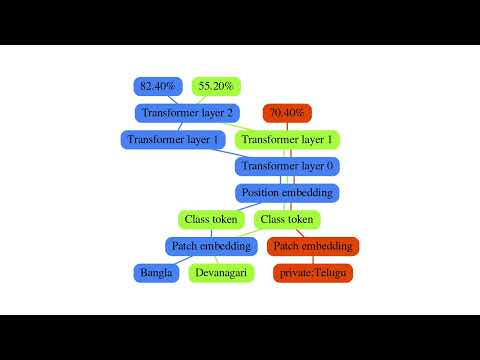

In [ ]:
"""
Starting local Bazel server and connecting to it...
Loading: 0 packages loaded
Loading: 0 packages loaded
    currently loading: 
Loading: 0 packages loaded
    currently loading: 
    Fetching @rules_cc; fetching
Analyzing: target //:run_search_experiment (1 packages loaded, 0 targets confi\
...
...
CPU times: user 5.05 s, sys: 521 ms, total: 5.57 s
Wall time: 7min 51s
 """
print("Alternative Run Visualisiation")
from IPython.display import YouTubeVideo
YouTubeVideo('Pcin4hPGaOk')

In [ ]:
# %%bash
# cd google-research/automl_zero && \
# bazel run -c opt \
#   --copt=-DMAX_SCALAR_ADDRESSES=5 \
#   --copt=-DMAX_VECTOR_ADDRESSES=9 \
#   --copt=-DMAX_MATRIX_ADDRESSES=2 \
#   :run_search_experiment -- \
#   --search_experiment_spec=" \
#     search_tasks { \
#       tasks { \
#         projected_binary_classification_task { \
#           dataset_name: 'cifar10' \
#           path: '${DATA_DIR}' \
#           held_out_pairs {positive_class: 0 negative_class: 5} \
#           held_out_pairs {positive_class: 0 negative_class: 9} \
#           held_out_pairs {positive_class: 1 negative_class: 8} \
#           held_out_pairs {positive_class: 2 negative_class: 9} \
#           held_out_pairs {positive_class: 3 negative_class: 5} \
#           held_out_pairs {positive_class: 3 negative_class: 6} \
#           held_out_pairs {positive_class: 3 negative_class: 8} \
#           held_out_pairs {positive_class: 4 negative_class: 6} \
#           held_out_pairs {positive_class: 8 negative_class: 9} \
#           max_supported_data_seed: 100 \
#         } \
#         features_size: 16 \
#         num_train_examples: 8000 \
#         num_valid_examples: 1000 \
#         num_train_epochs: 1 \
#         num_tasks: 10 \
#         eval_type: ACCURACY \
#       } \
#     } \
#     setup_ops: [SCALAR_CONST_SET_OP, SCALAR_GAUSSIAN_SET_OP, SCALAR_UNIFORM_SET_OP, VECTOR_GAUSSIAN_SET_OP, VECTOR_UNIFORM_SET_OP, MATRIX_GAUSSIAN_SET_OP, MATRIX_UNIFORM_SET_OP] \
#     predict_ops: [SCALAR_SUM_OP, MATRIX_VECTOR_PRODUCT_OP, VECTOR_MAX_OP, VECTOR_INNER_PRODUCT_OP, VECTOR_SUM_OP] \
#     learn_ops: [SCALAR_SUM_OP, SCALAR_DIFF_OP, SCALAR_PRODUCT_OP, SCALAR_VECTOR_PRODUCT_OP, VECTOR_SUM_OP, VECTOR_HEAVYSIDE_OP, VECTOR_PRODUCT_OP, VECTOR_OUTER_PRODUCT_OP, MATRIX_SUM_OP] \
#     setup_size_init: 1 \
#     mutate_setup_size_min: 1 \
#     mutate_setup_size_max: 7 \
#     predict_size_init: 1 \
#     mutate_predict_size_min: 1 \
#     mutate_predict_size_max: 11 \
#     learn_size_init: 1 \
#     mutate_learn_size_min: 1 \
#     mutate_learn_size_max: 23 \
#     train_budget {train_budget_baseline: NEURAL_NET_ALGORITHM} \
#     fitness_combination_mode: MEAN_FITNESS_COMBINATION \
#     population_size: 100 \
#     tournament_size: 10 \
#     initial_population: NO_OP_ALGORITHM \
#     max_train_steps: 100000000000 \
#     allowed_mutation_types {
#       mutation_types: [ALTER_PARAM_MUTATION_TYPE, RANDOMIZE_COMPONENT_FUNCTION_MUTATION_TYPE, INSERT_INSTRUCTION_MUTATION_TYPE, REMOVE_INSTRUCTION_MUTATION_TYPE] \
#     } \
#     mutate_prob: 0.9 \
#     progress_every: 10000 \
#     " \
#   --final_tasks="
#     tasks { \
#       projected_binary_classification_task { \
#         dataset_name: 'cifar10' \
#         path: '${DATA_DIR}' \
#         held_out_pairs {positive_class: 0 negative_class: 1} \
#         held_out_pairs {positive_class: 0 negative_class: 2} \
#         held_out_pairs {positive_class: 0 negative_class: 3} \
#         held_out_pairs {positive_class: 0 negative_class: 4} \
#         held_out_pairs {positive_class: 0 negative_class: 6} \
#         held_out_pairs {positive_class: 0 negative_class: 7} \
#         held_out_pairs {positive_class: 0 negative_class: 8} \
#         held_out_pairs {positive_class: 1 negative_class: 2} \
#         held_out_pairs {positive_class: 1 negative_class: 3} \
#         held_out_pairs {positive_class: 1 negative_class: 4} \
#         held_out_pairs {positive_class: 1 negative_class: 5} \
#         held_out_pairs {positive_class: 1 negative_class: 6} \
#         held_out_pairs {positive_class: 1 negative_class: 7} \
#         held_out_pairs {positive_class: 1 negative_class: 9} \
#         held_out_pairs {positive_class: 2 negative_class: 3} \
#         held_out_pairs {positive_class: 2 negative_class: 4} \
#         held_out_pairs {positive_class: 2 negative_class: 5} \
#         held_out_pairs {positive_class: 2 negative_class: 6} \
#         held_out_pairs {positive_class: 2 negative_class: 7} \
#         held_out_pairs {positive_class: 2 negative_class: 8} \
#         held_out_pairs {positive_class: 3 negative_class: 4} \
#         held_out_pairs {positive_class: 3 negative_class: 7} \
#         held_out_pairs {positive_class: 3 negative_class: 9} \
#         held_out_pairs {positive_class: 4 negative_class: 5} \
#         held_out_pairs {positive_class: 4 negative_class: 7} \
#         held_out_pairs {positive_class: 4 negative_class: 8} \
#         held_out_pairs {positive_class: 4 negative_class: 9} \
#         held_out_pairs {positive_class: 5 negative_class: 6} \
#         held_out_pairs {positive_class: 5 negative_class: 7} \
#         held_out_pairs {positive_class: 5 negative_class: 8} \
#         held_out_pairs {positive_class: 5 negative_class: 9} \
#         held_out_pairs {positive_class: 6 negative_class: 7} \
#         held_out_pairs {positive_class: 6 negative_class: 8} \
#         held_out_pairs {positive_class: 6 negative_class: 9} \
#         held_out_pairs {positive_class: 7 negative_class: 8} \
#         held_out_pairs {positive_class: 7 negative_class: 9} \
#         max_supported_data_seed: 100 \
#       } \
#       features_size: 16 \
#       num_train_examples: 8000 \
#       num_valid_examples: 1000 \
#       num_train_epochs: 1 \
#       num_tasks: 100 \
#       eval_type: ACCURACY \
#     } \
#     " \
#   --random_seed=1000060 \
#   --select_tasks="
#     tasks { \
#       projected_binary_classification_task { \
#         dataset_name: 'cifar10' \
#         path: '${DATA_DIR}' \
#         held_out_pairs {positive_class: 0 negative_class: 5} \
#         held_out_pairs {positive_class: 0 negative_class: 9} \
#         held_out_pairs {positive_class: 1 negative_class: 8} \
#         held_out_pairs {positive_class: 2 negative_class: 9} \
#         held_out_pairs {positive_class: 3 negative_class: 5} \
#         held_out_pairs {positive_class: 3 negative_class: 6} \
#         held_out_pairs {positive_class: 3 negative_class: 8} \
#         held_out_pairs {positive_class: 4 negative_class: 6} \
#         held_out_pairs {positive_class: 8 negative_class: 9} \
#         max_supported_data_seed: 100 \
#       } \
#       features_size: 16 \
#       num_train_examples: 8000 \
#       num_valid_examples: 1000 \
#       num_train_epochs: 1 \
#       num_tasks: 10 \
#       eval_type: ACCURACY \
#     } \
#     "
print("... or else, ages later!")
print("Process is interrupted")


... or else, ages later!
Process is interrupted


### HPO & NAS muNet / AutoML-Zero:
*   Evolving Code that Learns
*   Evolving Learning Algorithms from Scratch
*   Exploring a Difficult Search Space

Such combined HPO & NAS is a technique that aims to automatically discover ML algorithms from scratch, 
using only basic mathematical operations as building blocks. It uses a variant of
evolutionary methods to search for programs that can solve small image classification problems.
It has been able to rediscover fundamental machine learning techniques, such as
two-layer neural networks with backpropagation, linear regression and dropout-like methods.
![Tensorflow Official HPO & NAS](https://1.bp.blogspot.com/-GK43VckX7Jk/XwZP6NfZmII/AAAAAAAAGN8/OFXfCgeXB4MTjcKqn8R91mrMozB4qMmyQCLcBGAsYHQ/s640/image2.png)
#### Ref:
### Tensorflow [Official](https://ai.googleblog.com/2020/07/automl-zero-evolving-code-that-learns.html) framework, as an alternative for [NNI](https://microsoft.com/en-us/research/project/neural-network-intelligence) (Neural Network Intelligence) toolkit used to automate feature engineering, NAS (neural architecture search), model compression, and HPO/HPT (hyper-parameter tuning) that supports PyTorch, TensorFlow & Jax ... etc. ![](https://1.bp.blogspot.com/-HZRniCIf7Kg/XwZPynbRhoI/AAAAAAAAGN4/1NYiPnmq8cAZnrhAZncq67ySs8CFKqxGQCLcBGAsYHQ/s640/image1.gif)


### Ref Publication: [arxiv:2205.10937](https://arxiv.org/pdf/2205.10937v2.pdf)
* 1st-HPO-muNet-Evolving-Pretrained-DNNs-into-Scalable-Auto-tuning-Multitask-Systems(Gesmundo-2022).pdf



## Advanced HPO Ref:
> "Continual Development Methodology for Large-scale Multitask Dynamic ML Systems" (2022) arxiv.org/abs/2209.07326v3
> More advanced HPO [Online](https://ai.googleblog.com/2020/07/automl-zero-evolving-code-that-learns.html) @ ai.googleblog.com/2020/07/automl-zero-evolving-code-that-learns.html

# 1st CycleGAN CyCADA

CycleGAN is a technique for translating images from one domain to another without paired examples. It uses two generators and two discriminators that form a cycle of transformations. The generators are U-Networks and the discriminators are decoders with PatchGAN option. The cycle consistency loss ensures that the original image can be reconstructed from the translated image. CycleGAN can be used for various applications such as season translation, style transfer, and object transfiguration.

Ref: (Zhu, 2017) "Unpaired Image-to-Image Translation Using Cycle-Consistent Adversarial Networks"


In [ ]:
 #@title ## 1st CyCADA (Cycle-Consistent Adversarial Domain Adaptation)

In [ ]:
# !git clone https://github.com/PacktPublishing/Advanced-Deep-Learning-with-Keras
# !cd Advanced-Deep-Learning-with-Keras && pip install -r requirements.txt

In [ ]:
# !cd Advanced-Deep-Learning-with-Keras/chapter7-cross-domain-gan && python cifar10-sampler-7.1.2.py

In [ ]:
# !cd Advanced-Deep-Learning-with-Keras/chapter7-cross-domain-gan && python svhn-sampler-7.1.3.py

In [ ]:
# cyclegan_cifar10-g_source.h5
# cyclegan_cifar10-g_target.h5
# cyclegan_mnist_svhn-g_source.h5
# cyclegan_mnist_svhn-g_target.h5
# cifar10-sampler-7.1.2.py
# svhn-sampler-7.1.3.py
# cifar10_utils
# mnist_svhn_utils
# other_utils
# cyclegan-7.1.1.py
!wget https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/cifar10_utils
!wget https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/mnist_svhn_utils
!wget https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/other_utils
!wget https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/cifar10-sampler-7.1.2.py
!wget https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/svhn-sampler-7.1.3.py
!wget https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/cyclegan-7.1.1.py

!wget https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/cyclegan_cifar10-g_source.h5
!wget https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/cyclegan_cifar10-g_target.h5
!wget https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/cyclegan_mnist_svhn-g_source.h5
!wget https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/cyclegan_mnist_svhn-g_target.h5
# from keras.models import load_model
# # model = load_model('Advanced-Deep-Learning-with-Keras/chapter7-cross-domain-gan/cyclegan_cifar10-g_source.h5')
# model = load_model('cyclegan_cifar10-g_source.h5')
# model.summery()

--2023-03-19 16:02:46--  https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/cifar10_utils
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2023-03-19 16:02:46 ERROR 404: Not Found.

--2023-03-19 16:02:47--  https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/mnist_svhn_utils
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2023-03-19 16:02:47 ERROR 404: Not Found.

--2023-03-19 16:02:48--  https://raw.gith

In [ ]:
# !pip install -q tensorflow-addons #==0.10.0
!pip install -q -U tensorflow-addons
# !pip install -q -U tensorflow-addons[tensorflow]
# !pip install -q git+https://github.com/keras-team/keras-contrib.git

In [ ]:
# from keras_contrib.layers.normalization import InstanceNormalization
# from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
# install: pip install tensorflow-addons

In [ ]:
!wget https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/cifar10_utils

--2023-03-19 16:03:11--  https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/cifar10_utils
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2023-03-19 16:03:11 ERROR 404: Not Found.



In [ ]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import tensorflow as tf
import tensorflow_addons as tfa
# from keras_contrib.layers import InstanceNormalization
from tensorflow_addons.layers import InstanceNormalization

from tensorflow.keras.layers import Activation, Dense, Input
from tensorflow.keras.layers import Conv2D, Flatten
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import concatenate
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model

# from keras_contrib.layers.normalization import InstanceNormalization
# from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
# install: pip install tensorflow-addons
from tensorflow_addons.layers import InstanceNormalization

import numpy as np
import argparse
import datetime

# import cifar10_utils
# import mnist_svhn_utils
# import other_utils


In [ ]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import numpy as np
import matplotlib.pyplot as plt
import os
import math

def other_utils_rgb2gray(rgb):
    """Convert from color image (RGB) to grayscale
       Reference: opencv.org
       Formula: grayscale = 0.299*red + 0.587*green + 0.114*blue
    """
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])


def display_images(imgs,
                   filename,
                   title='',
                   imgs_dir=None,
                   show=False):
    """Display images in an nxn grid
    Arguments:
    imgs (tensor): array of images
    filename (string): filename to save the displayed image
    title (string): title on the displayed image
    imgs_dir (string): directory where to save the files
    show (bool): whether to display the image or not 
          (False during training, True during testing)
    """

    rows = imgs.shape[1]
    cols = imgs.shape[2]
    channels = imgs.shape[3]
    side = int(math.sqrt(imgs.shape[0]))
    assert int(side * side) == imgs.shape[0]

    # create saved_images folder
    if imgs_dir is None:
        imgs_dir = 'saved_images'
    save_dir = os.path.join(os.getcwd(), imgs_dir)
    if not os.path.isdir(save_dir):
        os.makedirs(save_dir)
    filename = os.path.join(imgs_dir, filename)
    # rows, cols, channels = img_shape
    if channels==1:
        imgs = imgs.reshape((side, side, rows, cols))
    else:
        imgs = imgs.reshape((side, side, rows, cols, channels))
    imgs = np.vstack([np.hstack(i) for i in imgs])
    plt.figure()
    plt.axis('off')
    plt.title(title)
    if channels==1:
        plt.imshow(imgs, interpolation='none', cmap='gray')
    else:
        plt.imshow(imgs, interpolation='none')
    plt.savefig(filename)
    if show:
        plt.show()
    
    plt.close('all')


def other_utils_test_generator(generators,
                   test_data,
                   step,
                   titles,
                   dirs,
                   todisplay=100,
                   show=False):
    """Test the generator models
    Arguments:
    generators (tuple): source and target generators
    test_data (tuple): source and target test data
    step (int): step number during training (0 during testing)
    titles (tuple): titles on the displayed image
    dirs (tuple): folders to save the outputs of testings
    todisplay (int): number of images to display (must be
        perfect square)
    show (bool): whether to display the image or not 
          (False during training, True during testing)
    """


    # predict the output from test data
    g_source, g_target = generators
    test_source_data, test_target_data = test_data
    t1, t2, t3, t4 = titles
    title_pred_source = t1
    title_pred_target = t2
    title_reco_source = t3
    title_reco_target = t4
    dir_pred_source, dir_pred_target = dirs

    pred_target_data = g_target.predict(test_source_data)
    pred_source_data = g_source.predict(test_target_data)
    reco_source_data = g_source.predict(pred_target_data)
    reco_target_data = g_target.predict(pred_source_data)

    # display the 1st todisplay images
    imgs = pred_target_data[:todisplay]
    filename = '%06d.png' % step
    step = " Step: {:,}".format(step)
    title = title_pred_target + step
    display_images(imgs,
                   filename=filename,
                   imgs_dir=dir_pred_target,
                   title=title,
                   show=show)

    imgs = pred_source_data[:todisplay]
    title = title_pred_source
    display_images(imgs,
                   filename=filename,
                   imgs_dir=dir_pred_source,
                   title=title,
                   show=show)

    imgs = reco_source_data[:todisplay]
    title = title_reco_source
    filename = "reconstructed_source.png"
    display_images(imgs,
                   filename=filename,
                   imgs_dir=dir_pred_source,
                   title=title,
                   show=show)

    imgs = reco_target_data[:todisplay]
    title = title_reco_target
    filename = "reconstructed_target.png"
    display_images(imgs,
                   filename=filename,
                   imgs_dir=dir_pred_target,
                   title=title,
                   show=show)


def other_utils_load_data(data, titles, filenames, todisplay=100):
    """Generic loaded data transformation
    Arguments:
    data (tuple): source, target, test source, test target data
    titles (tuple): titles of the test and source images to display
    filenames (tuple): filenames of the test and source images to
       display
    todisplay (int): number of images to display (must be
        perfect square)
    """

    source_data, target_data, test_source_data, test_target_data = data
    test_source_filename, test_target_filename = filenames
    test_source_title, test_target_title = titles

    # display test target images
    imgs = test_target_data[:todisplay]
    display_images(imgs,
                   filename=test_target_filename,
                   title=test_target_title)

    # display test source images
    imgs = test_source_data[:todisplay]
    display_images(imgs,
                   filename=test_source_filename,
                   title=test_source_title)

    # normalize images
    target_data = target_data.astype('float32')  / 255
    test_target_data = test_target_data.astype('float32') / 255

    source_data = source_data.astype('float32')  / 255
    test_source_data = test_source_data.astype('float32') / 255

    # source data, target data, test_source data
    data = (source_data, target_data, test_source_data, test_target_data)

    rows = source_data.shape[1]
    cols = source_data.shape[2]
    channels = source_data.shape[3]
    source_shape = (rows, cols, channels)

    rows = target_data.shape[1]
    cols = target_data.shape[2]
    channels = target_data.shape[3]
    target_shape = (rows, cols, channels)

    shapes = (source_shape, target_shape)
    
    return data, shapes

In [ ]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

from tensorflow.keras.datasets import cifar10

import numpy as np
# import other_utils


def cifar10_utils_load_data():
    # load CIFAR10 data
    (target_data, _), (test_target_data, _) = cifar10.load_data()

    # input image dimensions
    # we assume data format "channels_last"
    rows = target_data.shape[1]
    cols = target_data.shape[2]
    channels = target_data.shape[3]

    # convert color train and test images to gray
    # source_data = other_utils.rgb2gray(target_data)
    source_data = other_utils_rgb2gray(target_data)
    # test_source_data = other_utils.rgb2gray(test_target_data)
    test_source_data = other_utils_rgb2gray(test_target_data)
    # reshape images to row x col x channel for CNN input
    source_data = source_data.reshape(source_data.shape[0],
                                      rows,
                                      cols,
                                      1)
    test_source_data = test_source_data.reshape(test_source_data.shape[0],
                                                rows,
                                                cols,
                                                1)

    # source data, target data, test_source data
    data = (source_data, target_data, test_source_data, test_target_data)
    filenames = ('cifar10_test_source.png', 'cifar10_test_target.png')
    titles = ('CIFAR10 test source images', 'CIFAR10 test target images')
    
    # return other_utils.load_data(data, titles, filenames)
    return other_utils_load_data(data, titles, filenames)


In [ ]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import get_file

import numpy as np
from scipy import io
# import other_utils
import os


def get_datadir():
    cache_dir = os.path.join(os.path.expanduser('~'), '.keras')
    cache_subdir = 'datasets'
    datadir_base = os.path.expanduser(cache_dir)
    if not os.access(datadir_base, os.W_OK):
        datadir_base = os.path.join('/tmp', '.keras')

    datadir = os.path.join(datadir_base, cache_subdir)
    if not os.path.exists(datadir):
        os.makedirs(datadir)

    return datadir


def mnist_svhn_utils_load_data():
    # load mnist data
    (source_data, _), (test_source_data, _) = mnist.load_data()

    # pad with zeros 28x28 MNIST image to become 32x32
    # svhn is 32x32
    source_data = np.pad(source_data,
                         ((0,0), (2,2), (2,2)),
                         'constant',
                         constant_values=0)
    test_source_data = np.pad(test_source_data,
                              ((0,0), (2,2), (2,2)),
                              'constant',
                              constant_values=0)
    # input image dimensions
    # we assume data format "channels_last"
    rows = source_data.shape[1]
    cols = source_data.shape[2]
    channels = 1

    # reshape images to row x col x channels
    # for CNN output/validation
    size = source_data.shape[0]
    source_data = source_data.reshape(size,
                                      rows,
                                      cols,
                                      channels)
    size = test_source_data.shape[0]
    test_source_data = test_source_data.reshape(size,
                                                rows,
                                                cols,
                                                channels)

    # load SVHN data
    datadir = get_datadir()
    get_file('train_32x32.mat',
             origin='http://ufldl.stanford.edu/housenumbers/train_32x32.mat')
    get_file('test_32x32.mat',
             'http://ufldl.stanford.edu/housenumbers/test_32x32.mat')
    path = os.path.join(datadir, 'train_32x32.mat')
    target_data = loadmat(path)
    path = os.path.join(datadir, 'test_32x32.mat')
    test_target_data = loadmat(path)

    # source data, target data, test_source data
    data = (source_data, target_data, test_source_data, test_target_data)
    filenames = ('mnist_test_source.png', 'svhn_test_target.png')
    titles = ('MNIST test source images', 'SVHN test target images')
    
    # return other_utils.load_data(data, titles, filenames)
    return other_utils_load_data(data, titles, filenames)


def loadmat(filename):
    # load SVHN dataset
    mat = io.loadmat(filename)
    # the key to image data is 'X', the image label key is 'y'
    data = mat['X']
    rows =data.shape[0]
    cols = data.shape[1]
    channels = data.shape[2]
    # in matlab data, the image index is the last index
    # in keras, the image index is the first index so
    # perform transpose for the last index
    data = np.transpose(data, (3, 0, 1, 2))
    return data

In [ ]:
# !wget https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/cyclegan_cifar10-g_source.h5
# from keras.models import load_model
# from tensorflow.models import load_model
# model = load_model('Advanced-Deep-Learning-with-Keras/chapter7-cross-domain-gan/cyclegan_cifar10-g_source.h5')
# model = tf.keras.models.load_model('cyclegan_cifar10-g_source.h5')


In [ ]:

!wget https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/cyclegan-7.1.1.py


--2023-03-19 16:03:15--  https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/cyclegan-7.1.1.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 21712 (21K) [text/plain]
Saving to: ‘cyclegan-7.1.1.py.1’

cyclegan-7.1.1.py.1 100%[===================>]  21.20K  --.-KB/s    in 0.002s  

2023-03-19 16:03:15 (11.8 MB/s) - ‘cyclegan-7.1.1.py.1’ saved [21712/21712]



# Fine-tuned Model of the pre-trained CycleGAN CyCADA

In [ ]:
#@title ## CycleGAN CyCADA Arch

In [ ]:
!cd Advanced-Deep-Learning-with-Keras/chapter7-cross-domain-gan && python cyclegan-7.1.1.py

/bin/bash: line 0: cd: Advanced-Deep-Learning-with-Keras/chapter7-cross-domain-gan: No such file or directory


In [ ]:

# def encoder_layer(inputs,
#                   filters=16,
#                   kernel_size=3,
#                   strides=2,
#                   activation='relu',
#                   instance_norm=True):
#     """Builds a generic encoder layer made of Conv2D-IN-LeakyReLU
#     IN is optional, LeakyReLU may be replaced by ReLU
#     """

#     conv = Conv2D(filters=filters,
#                   kernel_size=kernel_size,
#                   strides=strides,
#                   padding='same')

#     x = inputs
#     if instance_norm:
#         x = InstanceNormalization()(x)
#     if activation == 'relu':
#         x = Activation('relu')(x)
#     else:
#         x = LeakyReLU(alpha=0.2)(x)
#     x = conv(x)
#     return x


# def decoder_layer(inputs,
#                   paired_inputs,
#                   filters=16,
#                   kernel_size=3,
#                   strides=2,
#                   activation='relu',
#                   instance_norm=True):
#     """Builds a generic decoder layer made of Conv2D-IN-LeakyReLU
#     IN is optional, LeakyReLU may be replaced by ReLU
#     Arguments: (partial)
#     inputs (tensor): the decoder layer input
#     paired_inputs (tensor): the encoder layer output 
#           provided by U-Net skip connection &
#           concatenated to inputs.
#     """

#     conv = Conv2DTranspose(filters=filters,
#                            kernel_size=kernel_size,
#                            strides=strides,
#                            padding='same')

#     x = inputs
#     if instance_norm:
#         x = InstanceNormalization()(x)
#     if activation == 'relu':
#         x = Activation('relu')(x)
#     else:
#         x = LeakyReLU(alpha=0.2)(x)
#     x = conv(x)
#     x = concatenate([x, paired_inputs])
#     return x


# def build_generator(input_shape,
#                     output_shape=None,
#                     kernel_size=3,
#                     name=None):
#     """The generator is a U-Network made of a 4-layer encoder
#     and a 4-layer decoder. Layer n-i is connected to layer i.
#     Arguments:
#     input_shape (tuple): input shape
#     output_shape (tuple): output shape
#     kernel_size (int): kernel size of encoder & decoder layers
#     name (string): name assigned to generator model
#     Returns:
#     generator (Model):
#     """

#     inputs = Input(shape=input_shape)
#     channels = int(output_shape[-1])
#     e1 = encoder_layer(inputs,
#                        32,
#                        kernel_size=kernel_size,
#                        activation='leaky_relu',
#                        strides=1)
#     e2 = encoder_layer(e1,
#                        64,
#                        activation='leaky_relu',
#                        kernel_size=kernel_size)
#     e3 = encoder_layer(e2,
#                        128,
#                        activation='leaky_relu',
#                        kernel_size=kernel_size)
#     e4 = encoder_layer(e3,
#                        256,
#                        activation='leaky_relu',
#                        kernel_size=kernel_size)

#     d1 = decoder_layer(e4,
#                        e3,
#                        128,
#                        kernel_size=kernel_size)
#     d2 = decoder_layer(d1,
#                        e2,
#                        64,
#                        kernel_size=kernel_size)
#     d3 = decoder_layer(d2,
#                        e1,
#                        32,
#                        kernel_size=kernel_size)
#     outputs = Conv2DTranspose(channels,
#                               kernel_size=kernel_size,
#                               strides=1,
#                               activation='sigmoid',
#                               padding='same')(d3)

#     generator = Model(inputs, outputs, name=name)

#     return generator


# def build_discriminator(input_shape,
#                         kernel_size=3,
#                         patchgan=True,
#                         name=None):
#     """The discriminator is a 4-layer encoder that outputs either
#     a 1-dim or a n x n-dim patch of probability that input is real 
#     Arguments:
#     input_shape (tuple): input shape
#     kernel_size (int): kernel size of decoder layers
#     patchgan (bool): whether the output is a patch 
#         or just a 1-dim
#     name (string): name assigned to discriminator model
#     Returns:
#     discriminator (Model):
#     """

#     inputs = Input(shape=input_shape)
#     x = encoder_layer(inputs,
#                       32,
#                       kernel_size=kernel_size,
#                       activation='leaky_relu',
#                       instance_norm=False)
#     x = encoder_layer(x,
#                       64,
#                       kernel_size=kernel_size,
#                       activation='leaky_relu',
#                       instance_norm=False)
#     x = encoder_layer(x,
#                       128,
#                       kernel_size=kernel_size,
#                       activation='leaky_relu',
#                       instance_norm=False)
#     x = encoder_layer(x,
#                       256,
#                       kernel_size=kernel_size,
#                       strides=1,
#                       activation='leaky_relu',
#                       instance_norm=False)

#     # if patchgan=True use nxn-dim output of probability
#     # else use 1-dim output of probability
#     if patchgan:
#         x = LeakyReLU(alpha=0.2)(x)
#         outputs = Conv2D(1,
#                          kernel_size=kernel_size,
#                          strides=2,
#                          padding='same')(x)
#     else:
#         x = Flatten()(x)
#         x = Dense(1)(x)
#         outputs = Activation('linear')(x)


#     discriminator = Model(inputs, outputs, name=name)

#     return discriminator


# def train_cyclegan(models,
#                    data,
#                    params,
#                    test_params, 
#                    test_generator):
#     """ Trains the CycleGAN. 
    
#     1) Train the target discriminator
#     2) Train the source discriminator
#     3) Train the forward and backward cyles of 
#         adversarial networks
#     Arguments:
#     models (Models): Source/Target Discriminator/Generator,
#         Adversarial Model
#     data (tuple): source and target training data
#     params (tuple): network parameters
#     test_params (tuple): test parameters
#     test_generator (function): used for generating 
#         predicted target and source images
#     """

#     # the models
#     g_source, g_target, d_source, d_target, adv = models
#     # network parameters
#     batch_size, train_steps, patch, model_name = params
#     # train dataset
#     source_data, target_data, test_source_data, test_target_data\
#             = data

#     titles, dirs = test_params

#     # the generator image is saved every 2000 steps
#     save_interval = 2000
#     target_size = target_data.shape[0]
#     source_size = source_data.shape[0]

#     # whether to use patchgan or not
#     if patch > 1:
#         d_patch = (patch, patch, 1)
#         valid = np.ones((batch_size,) + d_patch)
#         fake = np.zeros((batch_size,) + d_patch)
#     else:
#         valid = np.ones([batch_size, 1])
#         fake = np.zeros([batch_size, 1])

#     valid_fake = np.concatenate((valid, fake))
#     start_time = datetime.datetime.now()

#     for step in range(train_steps):
#         # sample a batch of real target data
#         rand_indexes = np.random.randint(0, 
#                                          target_size,
#                                          size=batch_size)
#         real_target = target_data[rand_indexes]

#         # sample a batch of real source data
#         rand_indexes = np.random.randint(0, 
#                                          source_size,
#                                          size=batch_size)
#         real_source = source_data[rand_indexes]
#         # generate a batch of fake target data fr real source data
#         fake_target = g_target.predict(real_source)
        
#         # combine real and fake into one batch
#         x = np.concatenate((real_target, fake_target))
#         # train the target discriminator using fake/real data
#         metrics = d_target.train_on_batch(x, valid_fake)
#         log = "%d: [d_target loss: %f]" % (step, metrics[0])

#         # generate a batch of fake source data fr real target data
#         fake_source = g_source.predict(real_target)
#         x = np.concatenate((real_source, fake_source))
#         # train the source discriminator using fake/real data
#         metrics = d_source.train_on_batch(x, valid_fake)
#         log = "%s [d_source loss: %f]" % (log, metrics[0])

#         # train the adversarial network using forward and backward
#         # cycles. the generated fake source and target 
#         # data attempts to trick the discriminators
#         x = [real_source, real_target]
#         y = [valid, valid, real_source, real_target]
#         metrics = adv.train_on_batch(x, y)
#         elapsed_time = datetime.datetime.now() - start_time
#         fmt = "%s [adv loss: %f] [time: %s]"
#         log = fmt % (log, metrics[0], elapsed_time)
#         print(log)
#         if (step + 1) % save_interval == 0:
#             test_generator((g_source, g_target),
#                            (test_source_data, test_target_data),
#                            step=step+1,
#                            titles=titles,
#                            dirs=dirs,
#                            show=False)

#     # save the models after training the generators
#     g_source.save(model_name + "-g_source.h5")
#     g_target.save(model_name + "-g_target.h5")


# def build_cyclegan(shapes,
#                    source_name='source',
#                    target_name='target',
#                    kernel_size=3,
#                    patchgan=False,
#                    identity=False
#                    ):
#     """Build the CycleGAN
#     1) Build target and source discriminators
#     2) Build target and source generators
#     3) Build the adversarial network
#     Arguments:
#     shapes (tuple): source and target shapes
#     source_name (string): string to be appended on dis/gen models
#     target_name (string): string to be appended on dis/gen models
#     kernel_size (int): kernel size for the encoder/decoder
#         or dis/gen models
#     patchgan (bool): whether to use patchgan on discriminator
#     identity (bool): whether to use identity loss
#     Returns:
#     (list): 2 generator, 2 discriminator, 
#         and 1 adversarial models 
#     """

#     source_shape, target_shape = shapes
#     lr = 2e-4
#     decay = 6e-8
#     gt_name = "gen_" + target_name
#     gs_name = "gen_" + source_name
#     dt_name = "dis_" + target_name
#     ds_name = "dis_" + source_name

#     # build target and source generators
#     g_target = build_generator(source_shape,
#                                target_shape,
#                                kernel_size=kernel_size,
#                                name=gt_name)
#     g_source = build_generator(target_shape,
#                                source_shape,
#                                kernel_size=kernel_size,
#                                name=gs_name)
#     print('---- TARGET GENERATOR ----')
#     g_target.summary()
#     print('---- SOURCE GENERATOR ----')
#     g_source.summary()

#     # build target and source discriminators
#     d_target = build_discriminator(target_shape,
#                                    patchgan=patchgan,
#                                    kernel_size=kernel_size,
#                                    name=dt_name)
#     d_source = build_discriminator(source_shape,
#                                    patchgan=patchgan,
#                                    kernel_size=kernel_size,
#                                    name=ds_name)
#     print('---- TARGET DISCRIMINATOR ----')
#     d_target.summary()
#     print('---- SOURCE DISCRIMINATOR ----')
#     d_source.summary()

#     optimizer = RMSprop(lr=lr, decay=decay)
#     d_target.compile(loss='mse',
#                      optimizer=optimizer,
#                      metrics=['accuracy'])
#     d_source.compile(loss='mse',
#                      optimizer=optimizer,
#                      metrics=['accuracy'])

#     d_target.trainable = False
#     d_source.trainable = False

#     # build the computational graph for the adversarial model
#     # forward cycle network and target discriminator
#     source_input = Input(shape=source_shape)
#     fake_target = g_target(source_input)
#     preal_target = d_target(fake_target)
#     reco_source = g_source(fake_target)

#     # backward cycle network and source discriminator
#     target_input = Input(shape=target_shape)
#     fake_source = g_source(target_input)
#     preal_source = d_source(fake_source)
#     reco_target = g_target(fake_source)

#     # if we use identity loss, add 2 extra loss terms
#     # and outputs
#     if identity:
#         iden_source = g_source(source_input)
#         iden_target = g_target(target_input)
#         loss = ['mse', 'mse', 'mae', 'mae', 'mae', 'mae']
#         loss_weights = [1., 1., 10., 10., 0.5, 0.5]
#         inputs = [source_input, target_input]
#         outputs = [preal_source,
#                    preal_target,
#                    reco_source,
#                    reco_target,
#                    iden_source,
#                    iden_target]
#     else:
#         loss = ['mse', 'mse', 'mae', 'mae']
#         loss_weights = [1., 1., 10., 10.]
#         inputs = [source_input, target_input]
#         outputs = [preal_source,
#                    preal_target,
#                    reco_source,
#                    reco_target]

#     # build adversarial model
#     adv = Model(inputs, outputs, name='adversarial')
#     optimizer = RMSprop(lr=lr*0.5, decay=decay*0.5)
#     adv.compile(loss=loss,
#                 loss_weights=loss_weights,
#                 optimizer=optimizer,
#                 metrics=['accuracy'])
#     print('---- ADVERSARIAL NETWORK ----')
#     adv.summary()

#     return g_source, g_target, d_source, d_target, adv


# def graycifar10_cross_colorcifar10(g_models=None):
#     """Build and train a CycleGAN that can do
#         grayscale <--> color cifar10 images
#     """

#     model_name = 'cyclegan_cifar10'
#     batch_size = 32
#     train_steps = 100000
#     patchgan = True
#     kernel_size = 3
#     postfix = ('%dp' % kernel_size) \
#             if patchgan else ('%d' % kernel_size)

#     data, shapes = cifar10_utils_load_data()
#     source_data, _, test_source_data, test_target_data = data
#     titles = ('CIFAR10 predicted source images.',
#               'CIFAR10 predicted target images.',
#               'CIFAR10 reconstructed source images.',
#               'CIFAR10 reconstructed target images.')
#     dirs = ('cifar10_source-%s' % postfix, \
#             'cifar10_target-%s' % postfix)

#     # generate predicted target(color) and source(gray) images
#     if g_models is not None:
#         g_source, g_target = g_models
#         # other_utils.test_generator((g_source, g_target),
#         other_utils_test_generator((g_source, g_target),
#                                    (test_source_data, \
#                                            test_target_data),
#                                    step=0,
#                                    titles=titles,
#                                    dirs=dirs,
#                                    show=True)
#         return

#     # build the cyclegan for cifar10 colorization
#     models = build_cyclegan(shapes,
#                             "gray-%s" % postfix,
#                             "color-%s" % postfix,
#                             kernel_size=kernel_size,
#                             patchgan=patchgan)
#     # patch size is divided by 2^n since we downscaled the input
#     # in the discriminator by 2^n (ie. we use strides=2 n times)
#     patch = int(source_data.shape[1] / 2**4) if patchgan else 1
#     params = (batch_size, train_steps, patch, model_name)
#     test_params = (titles, dirs)
#     # train the cyclegan
#     train_cyclegan(models,
#                    data,
#                    params,
#                    test_params,
#                   #  other_utils.test_generator)
#                    other_utils_test_generator)



# def mnist_cross_svhn(g_models=None):
#     """Build and train a CycleGAN that can do mnist <--> svhn
#     """

#     model_name = 'cyclegan_mnist_svhn'
#     batch_size = 32
#     train_steps = 100000
#     patchgan = True
#     kernel_size = 5
#     postfix = ('%dp' % kernel_size) \
#             if patchgan else ('%d' % kernel_size)

#     data, shapes = mnist_svhn_utils_load_data()
#     source_data, _, test_source_data, test_target_data = data
#     titles = ('MNIST predicted source images.',
#               'SVHN predicted target images.',
#               'MNIST reconstructed source images.',
#               'SVHN reconstructed target images.')
#     dirs = ('mnist_source-%s' \
#             % postfix, 'svhn_target-%s' % postfix)

#     # generate predicted target(svhn) and source(mnist) images
#     if g_models is not None:
#         g_source, g_target = g_models
#         # other_utils.test_generator((g_source, g_target),
#         other_utils_test_generator((g_source, g_target),
#                                    (test_source_data, \
#                                            test_target_data),
#                                    step=0,
#                                    titles=titles,
#                                    dirs=dirs,
#                                    show=True)
#         return

#     # build the cyclegan for mnist cross svhn
#     models = build_cyclegan(shapes,
#                             "mnist-%s" % postfix,
#                             "svhn-%s" % postfix,
#                             kernel_size=kernel_size,
#                             patchgan=patchgan)
#     # patch size is divided by 2^n since we downscaled the input
#     # in the discriminator by 2^n (ie. we use strides=2 n times)
#     patch = int(source_data.shape[1] / 2**4) if patchgan else 1
#     params = (batch_size, train_steps, patch, model_name)
#     test_params = (titles, dirs)
#     # train the cyclegan
#     train_cyclegan(models,
#                    data,
#                    params,
#                    test_params,
#                   #  other_utils.test_generator)
#                    other_utils_test_generator)


# if __name__ == '__main__':
#     parser = argparse.ArgumentParser()
#     help_ = "Load cifar10 source generator h5 model"
#     parser.add_argument("--cifar10_g_source", help=help_)
#     help_ = "Load cifar10 target generator h5 model"
#     parser.add_argument("--cifar10_g_target", help=help_)

#     help_ = "Load mnist_svhn source generator h5 model"
#     parser.add_argument("--mnist_svhn_g_source", help=help_)
#     help_ = "Load mnist_svhn target generator h5 model"
#     parser.add_argument("--mnist_svhn_g_target", help=help_)

#     help_ = "Train cifar10 colorization"
#     parser.add_argument("-c",
#                         "--cifar10",
#                         action='store_true',
#                         help=help_)
#     help_ = "Train mnist-svhn cross domain cyclegan"
#     parser.add_argument("-m",
#                         "--mnist-svhn",
#                         action='store_true',
#                         help=help_)
#     args = parser.parse_args()

#     # load pre-trained cifar10 source & target generators
#     if args.cifar10_g_source:
#         g_source = load_model(args.cifar10_g_source)
#         if args.cifar10_g_target:
#             g_target = load_model(args.cifar10_g_target)
#             g_models = (g_source, g_target)
#             graycifar10_cross_colorcifar10(g_models)
#     # load pre-trained mnist-svhn source & target generators
#     elif args.mnist_svhn_g_source:
#         g_source = load_model(args.mnist_svhn_g_source)
#         if args.mnist_svhn_g_target:
#             g_target = load_model(args.mnist_svhn_g_target)
#             g_models = (g_source, g_target)
#             mnist_cross_svhn(g_models)
#     # train a cifar10 CycleGAN
#     elif args.cifar10:
#         graycifar10_cross_colorcifar10()
#     # train a mnist-svhn CycleGAN
#     else:
#         mnist_cross_svhn()


![](https://raw.githubusercontent.com/PacktPublishing/Advanced-Deep-Learning-with-Keras/master/chapter7-cross-domain-gan/images/MNIST2SVHN.png)

# Tuning CycleGAN

Ref: TensorFlow Authors' CycleGAN based on [Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks](https://arxiv.org/abs/1703.10593); it explains a method that can translate images from one domain to another without paired data. It uses a cycle consistency loss to preserve the original context of the images. The text assumes the reader is familiar with Pix2Pix, a similar method that requires paired data. The text also provides a link to the paper that describes CycleGAN in detail and a tutorial on Pix2Pix.

## Set up the input pipeline

In [ ]:
## importing of the generator and the discriminator.
!pip install -q git+https://github.com/tensorflow/examples.git

  DEPRECATION: tensorflow-examples was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. pip 23.1 will enforce this behaviour change. A possible replacement is to fix the wheel build issue reported above. Discussion can be found at https://github.com/pypa/pip/issues/8368


In [ ]:
import tensorflow as tf

In [ ]:
import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output

AUTOTUNE = tf.data.AUTOTUNE

## Input Pipeline

It avoids overfitting as image augmentation [similar to pix2pix] technique, trains a model to translate from images of imageAs, to images of imageBs; then applys random mirroring  or jittering on the train dataset.


In [ ]:
!pip install -q datasets
from datasets import load_dataset
# dataset, metadata = load_dataset("huggan/cityscapes")
dataset = load_dataset("huggan/cityscapes")


Downloading:   0%|          | 0.00/709 [00:00<?, ?B/s]

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Dataset parquet downloaded and prepared to /root/.cache/huggingface/datasets/parquet/huggan--cityscapes-1a7c97b044361a2f/0.0.0/0b6d5799bb726b24ad7fc7be720c170d8e497f575d02d47537de9a5bac074901. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# !wget https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/cityscapes.zip --no-check-certificate
# !unzip cityscapes.zip

In [ ]:
## tensorflow.org/datasets/catalog/cycle_gan#cycle_gancityscapes
# dataset, metadata = tfds.load('cycle_gan/cityscapes',
#                              with_info=True, as_supervised=True)

# dataset, metadata = tfds.load('cycle_gan/summer2winter_yosemite',
#                               with_info=True, as_supervised=True)

dataset, metadata = tfds.load('cycle_gan/facades',
                              with_info=True, as_supervised=True)

train_imageAs, train_imageBs = dataset['trainA'], dataset['trainB']
test_imageAs, test_imageBs = dataset['testA'], dataset['testB']


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/4 [00:00<?, ? splits/s]

Generating trainA examples...:   0%|          | 0/400 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/facades/2.0.0.incompleteCS1W1S/cycle_gan-trainA.tfrecord*...:   …

Generating trainB examples...:   0%|          | 0/400 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/facades/2.0.0.incompleteCS1W1S/cycle_gan-trainB.tfrecord*...:   …

Generating testA examples...:   0%|          | 0/106 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/facades/2.0.0.incompleteCS1W1S/cycle_gan-testA.tfrecord*...:   0…

Generating testB examples...:   0%|          | 0/106 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/facades/2.0.0.incompleteCS1W1S/cycle_gan-testB.tfrecord*...:   0…

Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/facades/2.0.0. Subsequent calls will reuse this data.


In [ ]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [ ]:
def random_crop(image):
  cropped_image = tf.image.random_crop(
      image, size=[IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image

In [ ]:
# normalizing the images to [-1, 1]
def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image

In [ ]:
def random_jitter(image):
  # resizing to 286 x 286 x 3
  image = tf.image.resize(image, [286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  # randomly cropping to 256 x 256 x 3
  image = random_crop(image)

  # random mirroring
  image = tf.image.random_flip_left_right(image)

  return image

In [ ]:
def preprocess_image_train(image, label):
  image = random_jitter(image)
  image = normalize(image)
  return image

In [ ]:
def preprocess_image_test(image, label):
  image = normalize(image)
  return image

In [ ]:
train_imageAs = train_imageAs.cache().map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

train_imageBs = train_imageBs.cache().map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

test_imageAs = test_imageAs.map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

test_imageBs = test_imageBs.map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

In [ ]:
sample_imageA = next(iter(train_imageAs))
sample_imageB = next(iter(train_imageBs))

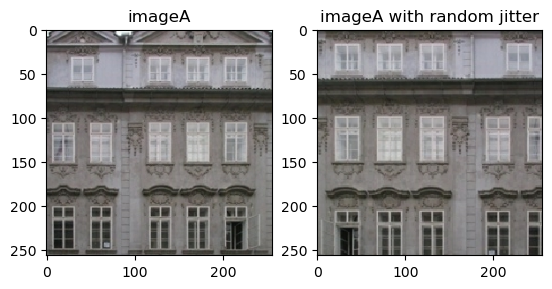

In [ ]:
plt.subplot(121)
plt.title('imageA')
plt.imshow(sample_imageA[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('imageA with random jitter')
plt.imshow(random_jitter(sample_imageA[0]) * 0.5 + 0.5)

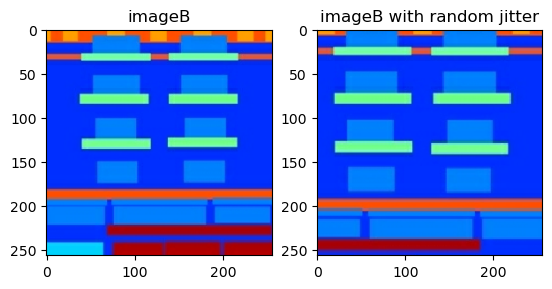

In [ ]:
plt.subplot(121)
plt.title('imageB')
plt.imshow(sample_imageB[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('imageB with random jitter')
plt.imshow(random_jitter(sample_imageB[0]) * 0.5 + 0.5)

## Import and reuse the Pix2Pix models

Import the generator and the discriminator used in [Pix2Pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py) via the installed [tensorflow_examples](https://github.com/tensorflow/examples) package.

The model architecture used in this tutorial is very similar to what was used in [pix2pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py). Some of the differences are:

* Cyclegan uses [instance normalization](https://arxiv.org/abs/1607.08022) instead of [batch normalization](https://arxiv.org/abs/1502.03167).
* The [CycleGAN paper](https://arxiv.org/abs/1703.10593) uses a modified `resnet` based generator. This tutorial is using a modified `unet` generator for simplicity.

There are 2 generators (G and F) and 2 discriminators (X and Y) being trained here. 

* Generator `G` learns to transform image `X` to image `Y`. $(G: X -> Y)$
* Generator `F` learns to transform image `Y` to image `X`. $(F: Y -> X)$
* Discriminator `D_X` learns to differentiate between image `X` and generated image `X` (`F(Y)`).
* Discriminator `D_Y` learns to differentiate between image `Y` and generated image `Y` (`G(X)`).

![Cyclegan model](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/cyclegan_model.png?raw=1)

In [ ]:
OUTPUT_CHANNELS = 3

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

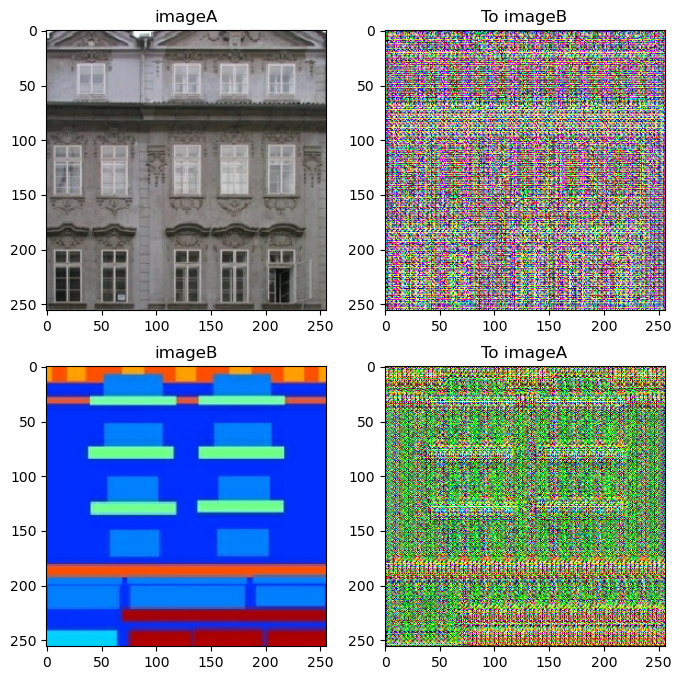

In [ ]:
to_imageB = generator_g(sample_imageA)
to_imageA = generator_f(sample_imageB)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_imageA, to_imageB, sample_imageB, to_imageA]
title = ['imageA', 'To imageB', 'imageB', 'To imageA']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

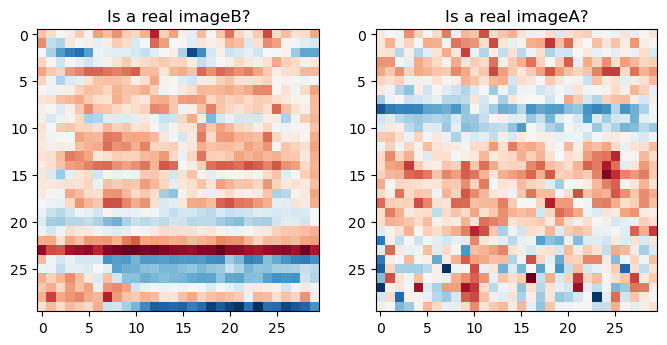

In [ ]:
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a real imageB?')
plt.imshow(discriminator_y(sample_imageB)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a real imageA?')
plt.imshow(discriminator_x(sample_imageA)[0, ..., -1], cmap='RdBu_r')

plt.show()

## Loss functions

In CycleGAN, there is no paired data to train on, hence there is no guarantee that the input `x` and the target `y` pair are meaningful during training. Thus in order to enforce that the network learns the correct mapping, the authors propose the cycle consistency loss.

The discriminator loss and the generator loss are similar to the ones used in [pix2pix](https://www.tensorflow.org/tutorials/generative/pix2pix#build_the_generator).

In [ ]:
LAMBDA = 10

In [ ]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)

  generated_loss = loss_obj(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

In [ ]:
def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

Cycle consistency means the result should be close to the original input. For example, if one translates a sentence from English to French, and then translates it back from French to English, then the resulting sentence should be the same as the  original sentence.

In cycle consistency loss, 

* Image $X$ is passed via generator $G$ that yields generated image $\hat{Y}$.
* Generated image $\hat{Y}$ is passed via generator $F$ that yields cycled image $\hat{X}$.
* Mean absolute error is calculated between $X$ and $\hat{X}$.

$$forward\ cycle\ consistency\ loss: X -> G(X) -> F(G(X)) \sim \hat{X}$$

$$backward\ cycle\ consistency\ loss: Y -> F(Y) -> G(F(Y)) \sim \hat{Y}$$


![Cycle loss](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/cycle_loss.png?raw=1)

In [ ]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
  
  return LAMBDA * loss1

As shown above, generator $G$ is responsible for translating image $X$ to image $Y$. Identity loss says that, if you fed image $Y$ to generator $G$, it should yield the real image $Y$ or something close to image $Y$.

If you run the imageB-to-imageA model on a imageA or the imageA-to-imageB model on a imageB, it should not modify the image much since the image already contains the target class.

$$Identity\ loss = |G(Y) - Y| + |F(X) - X|$$

In [ ]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss

Initialize the optimizers for all the generators and the discriminators.

In [ ]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## Checkpoints

In [ ]:
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

## Training

Note: This example model is trained for fewer epochs (10) than the paper (200) to keep training time reasonable for this tutorial. The generated images will have much lower quality.

In [ ]:
EPOCHS = 10 # 1

In [ ]:
def generate_images(model, test_input):
  prediction = model(test_input)
    
  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

Even though the training loop looks complicated, it consists of four basic steps:

* Get the predictions.
* Calculate the loss.
* Calculate the gradients using backpropagation.
* Apply the gradients to the optimizer.

In [ ]:
@tf.function
def train_step(real_x, real_y):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.
    
    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)
    
    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
    
    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
  
  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                        generator_f.trainable_variables)
  
  discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                            discriminator_y.trainable_variables)
  
  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                            generator_f.trainable_variables))
  
  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))
  
  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

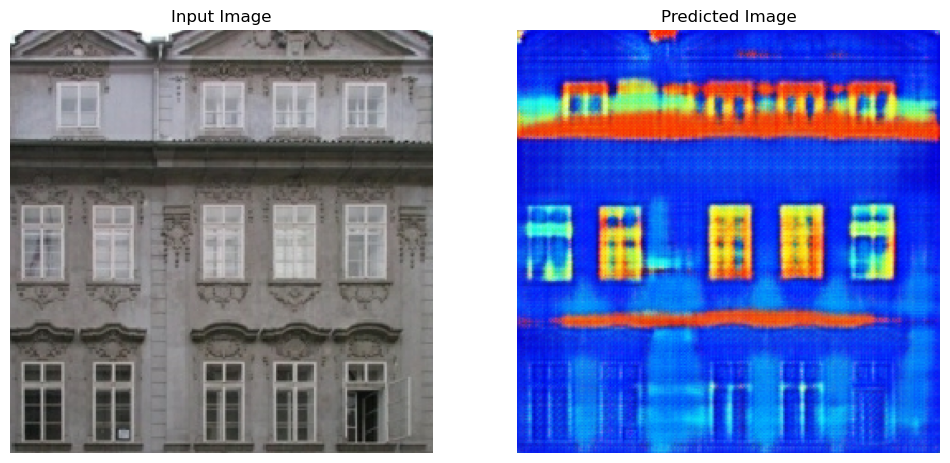

Saving checkpoint for epoch 10 at ./checkpoints/train/ckpt-2
Time taken for epoch 10 is 184.85323023796082 sec

CPU times: user 19min 14s, sys: 9min 7s, total: 28min 22s
Wall time: 30min 13s


In [ ]:
%%time
for epoch in range(EPOCHS):
  start = time.time()

  n = 0
  for image_x, image_y in tf.data.Dataset.zip((train_imageAs, train_imageBs)):
    train_step(image_x, image_y)
    if n % 10 == 0:
      print ('.', end='')
    n += 1

  clear_output(wait=True)
  # Using a consistent image (sample_imageA) so that the progress of the model
  # is clearly visible.
  generate_images(generator_g, sample_imageA)

  if (epoch + 1) % 5 == 0:
    ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         ckpt_save_path))

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))

## Generate using test dataset

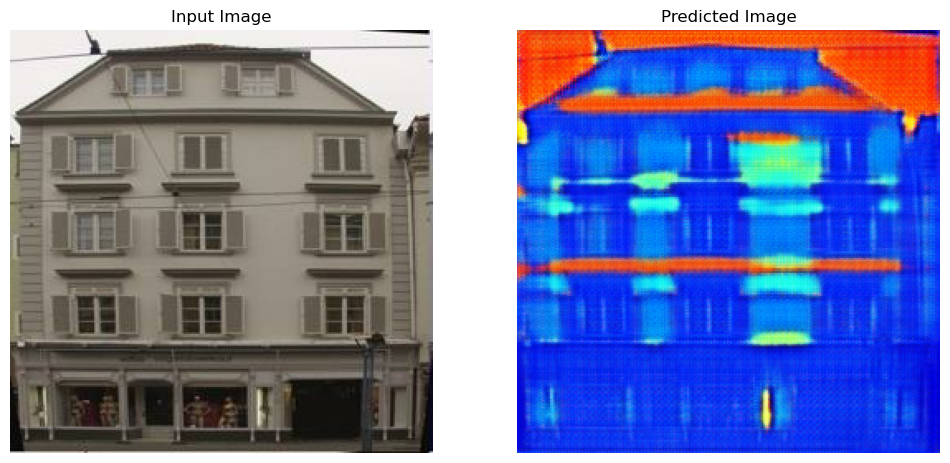

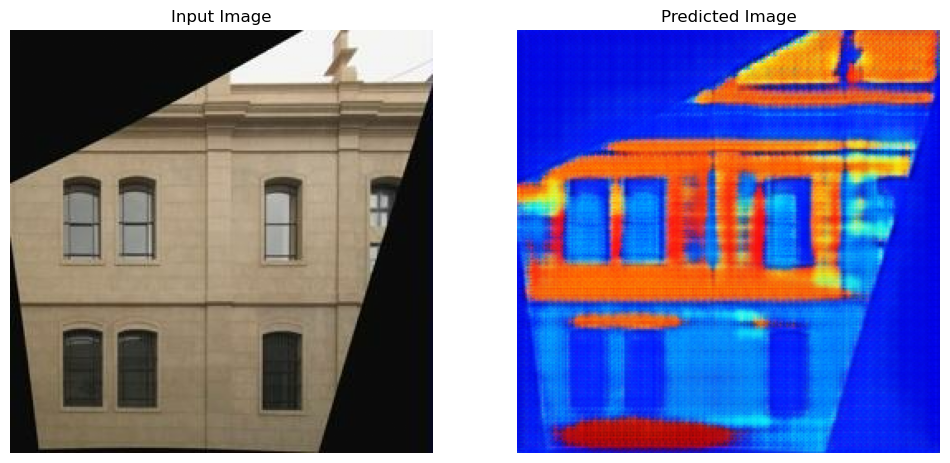

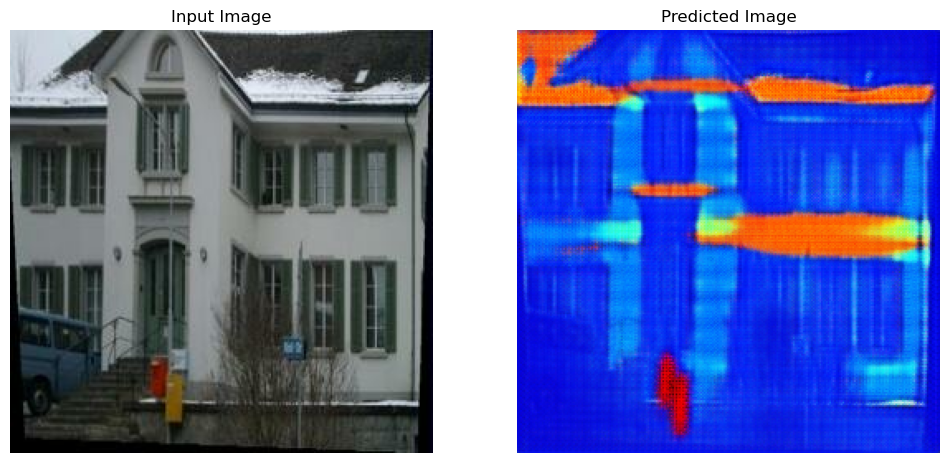

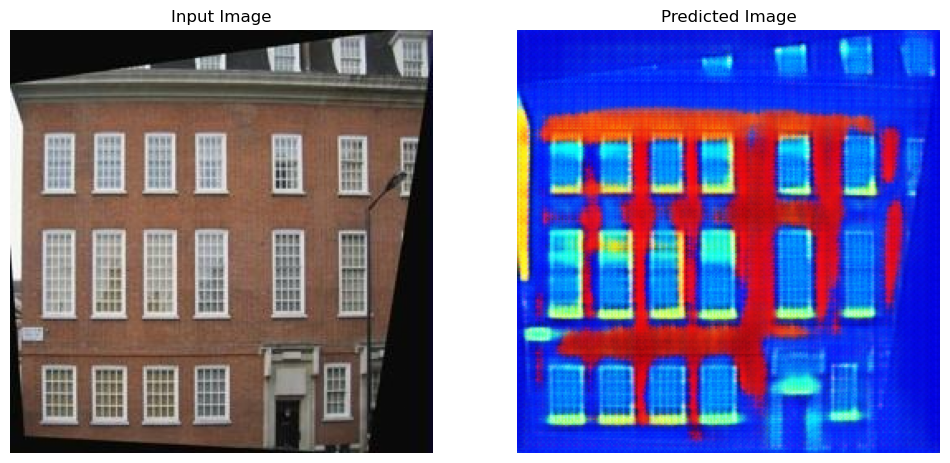

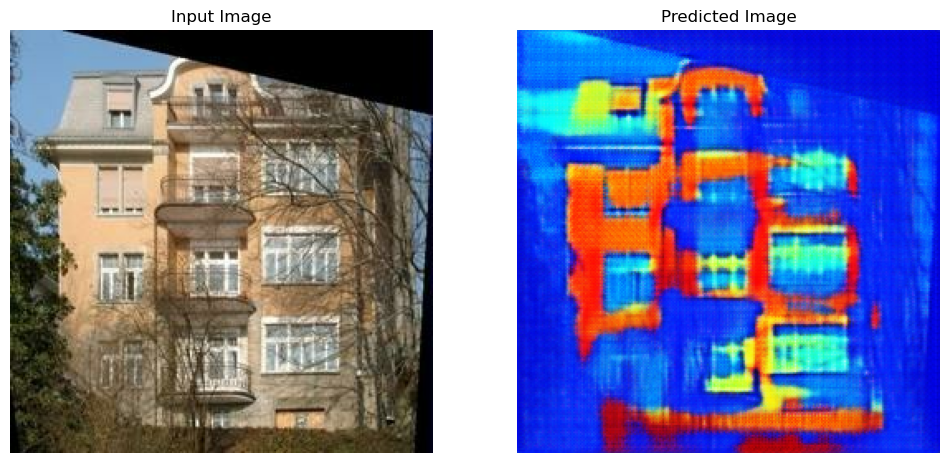

In [ ]:
# Run the trained model on the test dataset
for inp in test_imageAs.take(5):
  generate_images(generator_g, inp)

## Room for Imporovement
starting from the U-Net generator and discriminator implemented in Pix2Pix, implemented a simple CycleGAN. 
to improve the results, we could implement the modified [ResNet generator](https://arxiv.org/abs/1703.10593); or elas, train for a larger number of epochs:

In [ ]:
LAMBDA = 10

In [ ]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)

  generated_loss = loss_obj(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

In [ ]:
def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

In [ ]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
  
  return LAMBDA * loss1

In [ ]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss

In [ ]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

Latest checkpoint restored!!


In [ ]:
EPOCHS = 100 # 20 # 100 # 00

In [ ]:
def generate_images(model, test_input):
  prediction = model(test_input)
    
  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.savefig('image.png')
  plt.show()

In [ ]:
@tf.function
def train_step(real_x, real_y):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.
    
    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)
    
    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
    
    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
  
  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                        generator_f.trainable_variables)
  
  discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                            discriminator_y.trainable_variables)
  
  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                            generator_f.trainable_variables))
  
  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))
  
  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

#### %%time

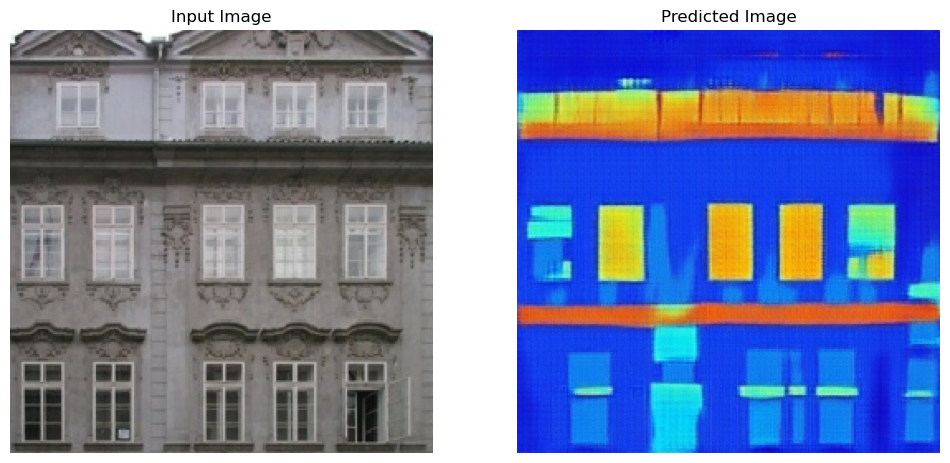

Saving checkpoint for epoch 100 at ./checkpoints/train/ckpt-22
Time taken for epoch 100 is 182.7919797897339 sec

CPU times: user 3h 9min 5s, sys: 1h 31min 35s, total: 4h 40min 41s
Wall time: 4h 57min 18s


In [ ]:
%%time
for epoch in range(EPOCHS):
  start = time.time()

  n = 0
  for image_x, image_y in tf.data.Dataset.zip((train_imageAs, train_imageBs)):
    train_step(image_x, image_y)
    if n % 10 == 0:
      print ('.', end='')
    n += 1

  clear_output(wait=True)
  # Using a consistent image (sample_horse) so that the progress of the model
  # is clearly visible.
  generate_images(generator_g, sample_imageA)

  if (epoch + 1) % 5 == 0:
    ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         ckpt_save_path))

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))

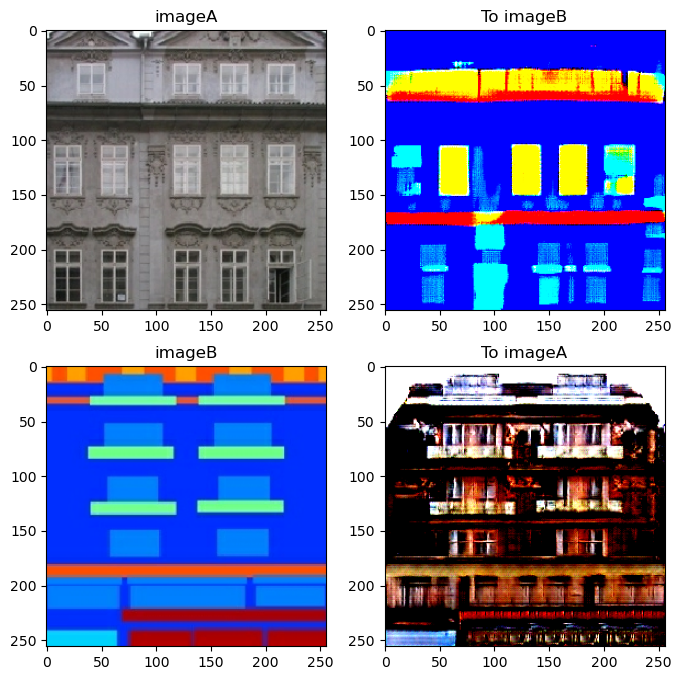

In [ ]:
to_imageB = generator_g(sample_imageA)
to_imageA = generator_f(sample_imageB)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_imageA, to_imageB, sample_imageB, to_imageA]
title = ['imageA', 'To imageB', 'imageB', 'To imageA']


for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

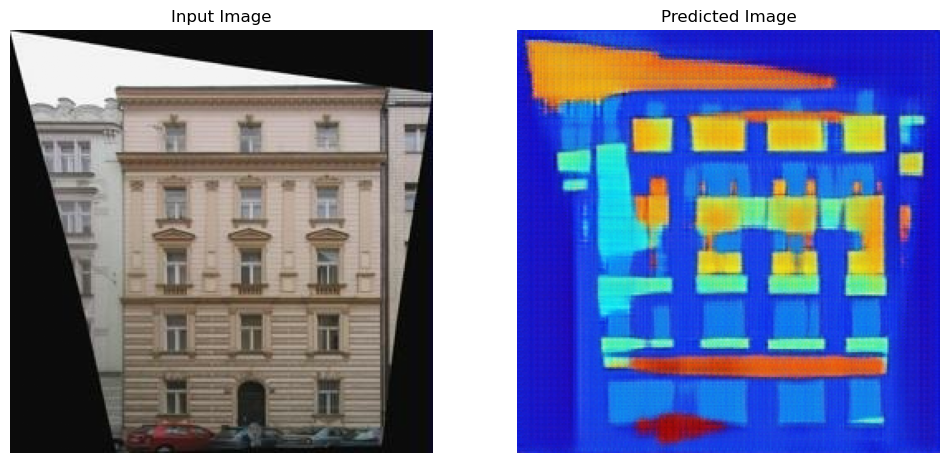

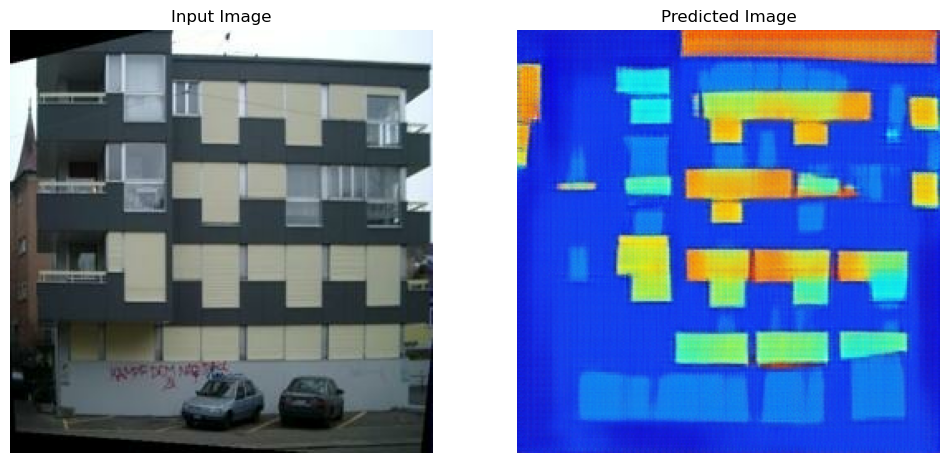

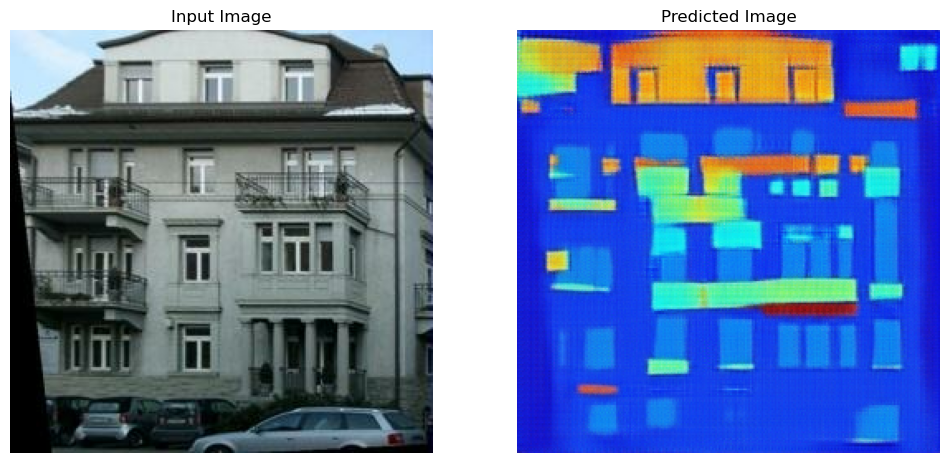

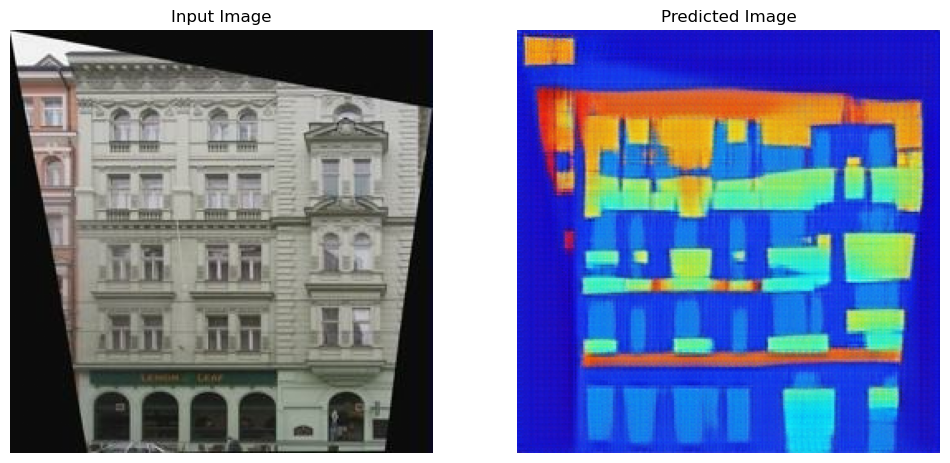

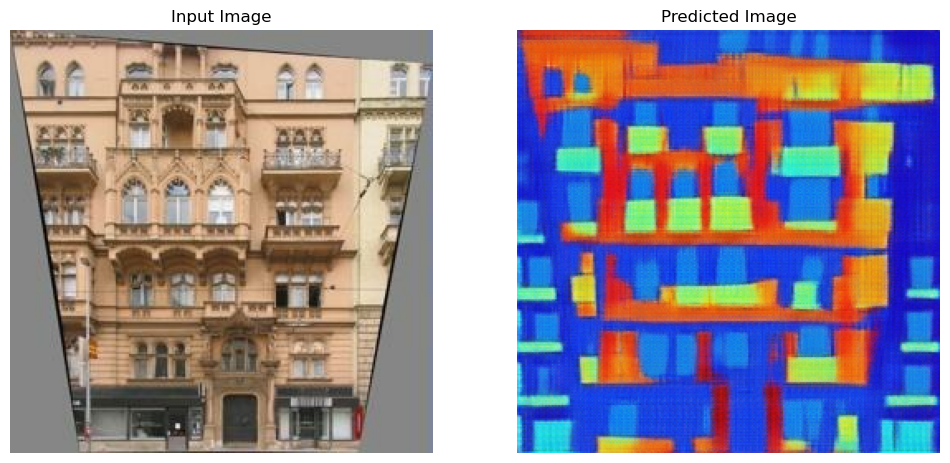

In [ ]:
# Run the trained model on the test dataset
for inp in test_imageAs.take(5):
  generate_images(generator_g, inp)

# End AoA

### Key Ref:

Atienza, R., 2020. Advanced Deep Learning with TensorFlow 2 and Keras: Apply DL, GANs, VAEs, deep RL, unsupervised learning, object detection and segmentation, and more. 2nd ed. Birmingham: Packt Publishing